In [3]:
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_VISIBLE_DEVICES=0


In [4]:
from medvqa.utils.files import load_pickle

import medvqa
from importlib import reload

In [24]:
!python ../scripts/mscxr/precompute_phrase_embeddings.py \
--model_name "microsoft/BiomedVLP-CXR-BERT-specialized" \
--model_checkpoint_folder_path \
"/mnt/data/pamessina/workspaces/medvqa-workspace/models/fact_embedding/20240207_184445_MIMIC-CXR(triplets+classif+entcont+nli+radgraph+autoencoder)_FactEncoder(microsoft-BiomedVLP-CXR-BERT-specialized)"

len(phrases): 715
Obtaining embeddings for each phrase...
checkpoint_names = ['checkpoint_91_cacc+chf1+chf1+cscc+encc+hscc+nlcc+sass+spss+ta0)+ta1)+ta2)+ta0)+ta1)+ta2)+ta3)+ta4)+ta5)+ta6)+ta7)=0.9337.pt']
  0%|                                                   | 0/715 [00:00<?, ?it/s]Loading cached text embeddings from /mnt/workspace/pamessina/medvqa-workspace/cache/text_embeddings_cache(hash=440,3465006188639683439).pkl
len(self.cache["hashes"]) = 4766841
self.cache["embeddings"].shape = (4766841, 128)
100%|████████████████████████████████████████| 715/715 [00:06<00:00, 106.17it/s]
Computing embeddings for 513 new texts
checkpoint_names = ['checkpoint_91_cacc+chf1+chf1+cscc+encc+hscc+nlcc+sass+spss+ta0)+ta1)+ta2)+ta0)+ta1)+ta2)+ta3)+ta4)+ta5)+ta6)+ta7)=0.9337.pt']
Loading model weights from /mnt/data/pamessina/workspaces/medvqa-workspace/models/fact_embedding/20240207_184445_MIMIC-CXR(triplets+classif+entcont+nli+radgraph+autoencoder)_FactEncoder(microsoft-BiomedVLP-CXR-BERT-specializ

In [3]:
!python ../scripts/mscxr/precompute_phrase_embeddings.py \
--model_name "microsoft/BiomedVLP-CXR-BERT-specialized" \
--model_checkpoint_folder_path \
"/mnt/data/pamessina/workspaces/medvqa-workspace/models/fact_embedding/20240629_084405_MIMIC-CXR(triplets+classif+entcont+nli+radgraph+autoencoder)_FactEncoder(microsoft-BiomedVLP-CXR-BERT-specialized)"

len(phrases): 715
Obtaining embeddings for each phrase...
checkpoint_names = ['checkpoint_196_cacc+chf1+chf1+cscc+encc+hscc+nlcc+sass+spss+ta0)+ta1)+ta2)+ta0)+ta1)+ta2)+ta3)+ta4)+ta5)+ta6)+ta7)=0.9189.pt']
  0%|                                                   | 0/715 [00:00<?, ?it/s]Loading cached text embeddings from /mnt/workspace/pamessina/medvqa-workspace/cache/text_embeddings_cache(hash=441,505879158912416539).pkl
len(self.cache["hashes"]) = 3351526
self.cache["embeddings"].shape = (3351526, 128)
100%|████████████████████████████████████████| 715/715 [00:02<00:00, 281.03it/s]
phrase_embeddings.shape: (715, 128)
len(phrase2embedding): 715
Saving output to: /mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3567052674817879091).pkl
Done!


In [4]:
# phrase2embedding = load_pickle('/mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3206715123524916204).pkl')
phrase2embedding = load_pickle('/mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3567052674817879091).pkl')

# 1) Phrase Grounding: DenseNet121 + CXRFE + Sigmoid-based attention

In [43]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240618_175951_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,SigmoidAttention,128,256,256,1)" \
--max_images_per_batch 100 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--mscxr_phrase2embedding_filepath \
"/mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3206715123524916204).pkl" \
--eval_mscxr

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240618_175951_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,SigmoidAttention,128,256,256,1)
   max_images_per_batch: 100
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 0
   device: GPU
   mscxr_phrase2embedding_filepath: /mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3206715123524916204).pkl
   eval_chest_imagenome_gold: False
   eval_mscxr: True
----- Evaluating model -----
metadata loaded from /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240618_175951_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,SigmoidAttention,128,256,256,1)/metadata.json
--------------------------------------------------
1) device = cuda
--------------------------------------------------
2) Creating instance of PhraseGrounder ...
MultiPurposeVisualModule()
  Initializing raw

In [94]:
tmp1 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20240618_175951_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,SigmoidAttention,128,256,256,1)/mscxr_metrics.pkl')

In [188]:
tmp = tmp1

In [189]:
tmp.keys()

dict_keys(['image_paths', 'phrases', 'pred_masks', 'gt_masks', 'ious', 'pg_segmask_iou'])

In [159]:
import numpy as np

In [160]:
idxs = np.argsort(tmp['ious'])[::-1]

In [161]:
for i in range(10):
    print(tmp['ious'][idxs[i]], tmp['phrases'][idxs[i]])

0.9222196936607361 cardiac silhouette is mildly enlarged
0.9011855125427246 cardiomegaly is present
0.9001855850219727 cardiomegaly noted
0.8986737132072449 cardiac silhouette is enlarged
0.8986091017723083 enlarged cardiac silhouette noted
0.8967530727386475 bilateral, diffuse lung consolidation is present, consistent with acute lung injury edema
0.8966353535652161 markedly enlarged cardiac silhouette
0.8940171003341675 mild cardiomegaly is present
0.8929531574249268 moderate cardiomegaly is present
0.8925387263298035 cardiac silhouette is enlarged


In [162]:
for i in range(-1, -11, -1):
    print(tmp['ious'][idxs[i]], tmp['phrases'][idxs[i]])

4.763368997373618e-05 Small left pneumothorax has increased
0.003397588385269046 loculated basilar hydropneumothorax
0.008356072008609772 there is a small right apical pneumothorax
0.00929185375571251 New focal haziness in the left lung base
0.011499735526740551 mild patchy consolidation in the right infrahilar lung
0.01461635623127222 Minimal residual right middle lobe opacity, otherwise clear lungs
0.0783521980047226 decreasing pneumonia
0.08523338288068771 small right apical pneumothorax
0.08659204840660095 Focal opacity in the lingula
0.0981958881020546 there is a left chest tube and small basilar left pneumothorax


In [173]:
reload(medvqa.utils.logging)
reload(medvqa.evaluation.plots)

<module 'medvqa.evaluation.plots' from '/home/pamessina/medvqa/medvqa/evaluation/plots.py'>

In [174]:
from medvqa.evaluation.plots import (
    plot_embeddings_sentences_and_scores,
    plot_segmentation_mask_area_vs_iou,
    plot_wordclouds_per_bin,
    visualize_attention_maps,
)
from medvqa.datasets.ms_cxr import PhraseGroundingAnnotationsVisualizer

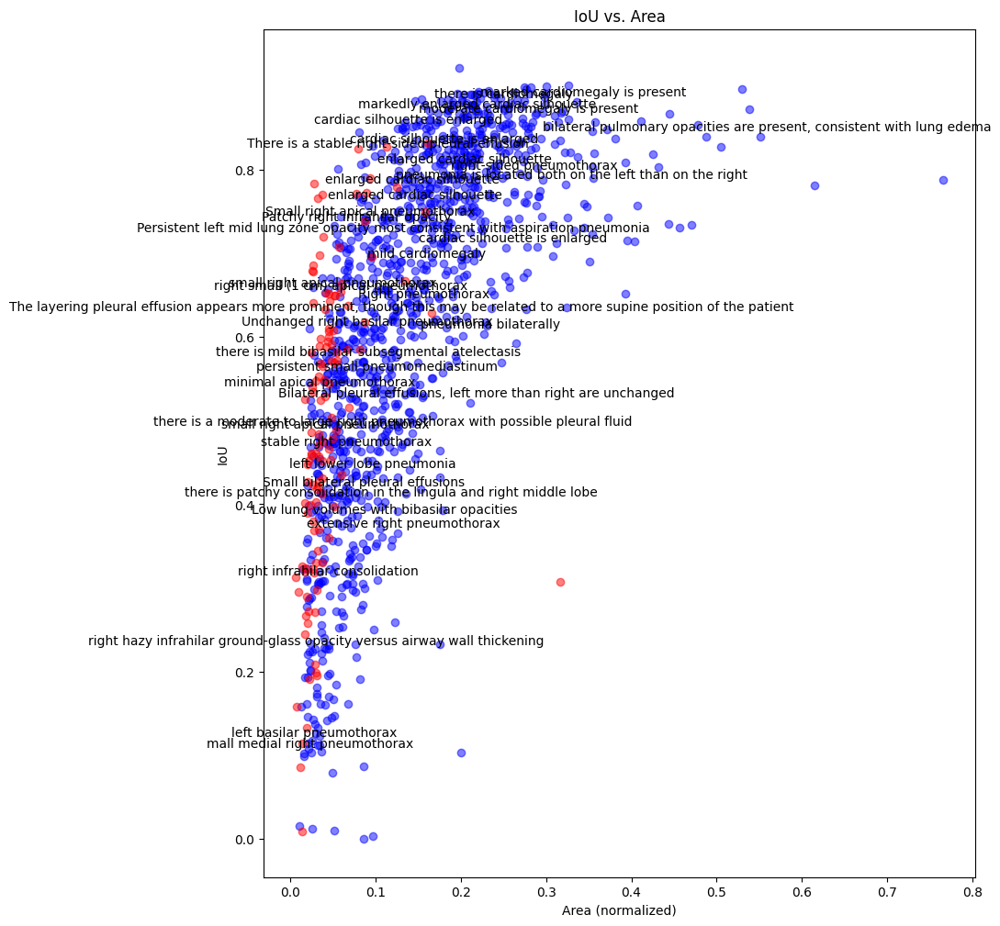

(IoU=0.881, area=0.336, idx=478) marked cardiomegaly is present
(IoU=0.878, area=0.243, idx=499) there is cardiomegaly
(IoU=0.866, area=0.212, idx=534) markedly enlarged cardiac silhouette
(IoU=0.861, area=0.272, idx=755) moderate cardiomegaly is present
(IoU=0.848, area=0.131, idx=668) cardiac silhouette is enlarged
(IoU=0.839, area=0.551, idx=363) bilateral pulmonary opacities are present, consistent with lung edema
(IoU=0.825, area=0.173, idx=526) cardiac silhouette is enlarged
(IoU=0.820, area=0.107, idx=928) There is a stable right-sided pleural effusion
(IoU=0.800, area=0.197, idx=649) enlarged cardiac silhouette
(IoU=0.793, area=0.278, idx=291) right-sided pneumothorax
(IoU=0.782, area=0.323, idx=167) pneumonia is located both on the left than on the right
(IoU=0.777, area=0.136, idx=158) enlarged cardiac silhouette
(IoU=0.758, area=0.139, idx=142) enlarged cardiac silhouette
(IoU=0.739, area=0.087, idx=161) Small right apical pneumothorax
(IoU=0.732, area=0.071, idx=356) Patchy

In [165]:
plot_segmentation_mask_area_vs_iou(
    masks_array=tmp['gt_masks'],
    iou_array=tmp['ious'],
    normalize_area=True,
    sentences=tmp['phrases'],
    num_annotations=40,
    figsize=(10, 12),
    highlight_points_with_sentences_containing='apical'
)

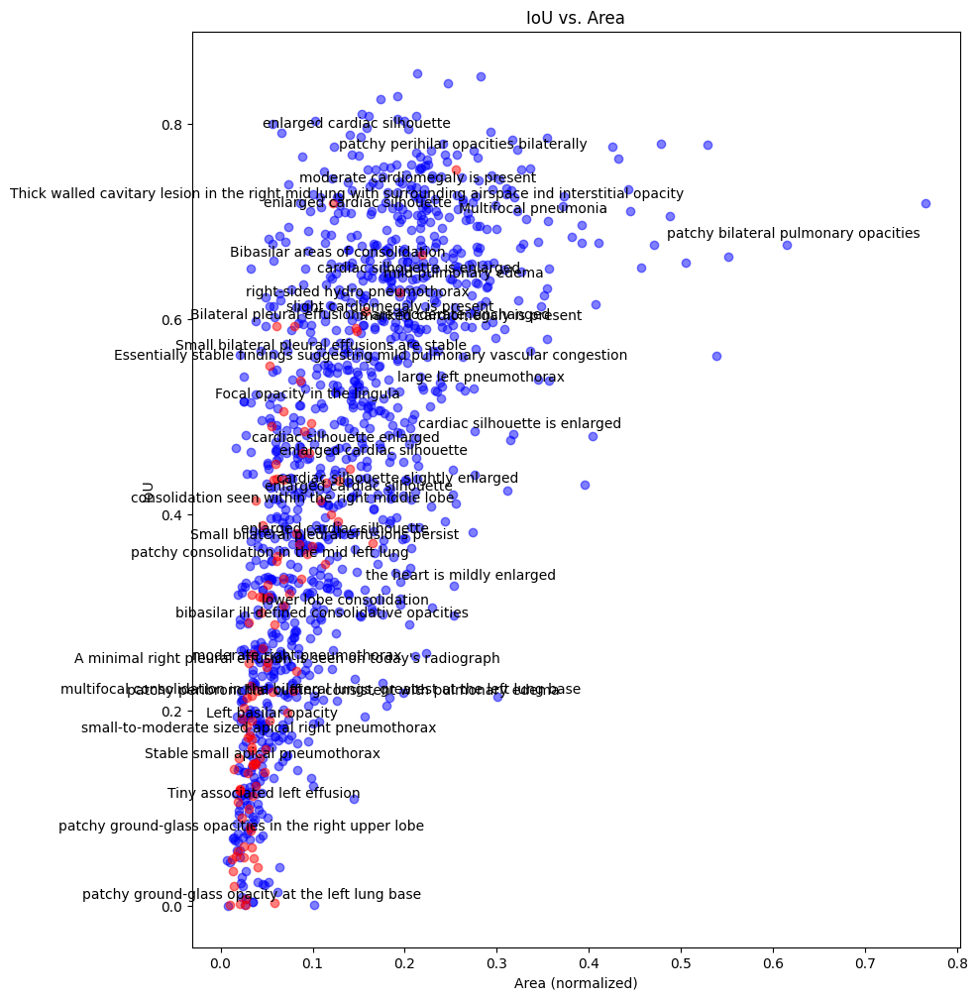

(IoU=0.789, area=0.140, idx=569) enlarged cardiac silhouette
(IoU=0.768, area=0.256, idx=512) patchy perihilar opacities bilaterally
(IoU=0.733, area=0.206, idx=431) moderate cardiomegaly is present
(IoU=0.717, area=0.130, idx=34) Thick walled cavitary lesion in the right mid lung with surrounding airspace ind interstitial opacity
(IoU=0.708, area=0.142, idx=385) enlarged cardiac silhouette
(IoU=0.702, area=0.332, idx=360) Multifocal pneumonia
(IoU=0.676, area=0.614, idx=282) patchy bilateral pulmonary opacities
(IoU=0.657, area=0.120, idx=66) Bibasilar areas of consolidation
(IoU=0.641, area=0.208, idx=464) cardiac silhouette is enlarged
(IoU=0.636, area=0.257, idx=780) mild pulmonary edema
(IoU=0.617, area=0.141, idx=205) right-sided hydro pneumothorax
(IoU=0.602, area=0.176, idx=904) slight cardiomegaly is present
(IoU=0.594, area=0.155, idx=704) Bilateral pleural effusions are moderate, unchanged
(IoU=0.593, area=0.265, idx=650) marked cardiomegaly is present
(IoU=0.562, area=0.102

In [187]:
plot_segmentation_mask_area_vs_iou(
    masks_array=tmp['gt_masks'],
    iou_array=tmp['ious'],
    normalize_area=True,
    sentences=tmp['phrases'],
    num_annotations=40,
    figsize=(10, 12),
    highlight_points_with_sentences_containing='small'
)

==================== Bin 1 (0.000-0.231)


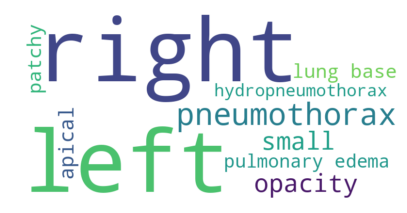

==================== Bin 2 (0.231-0.461)


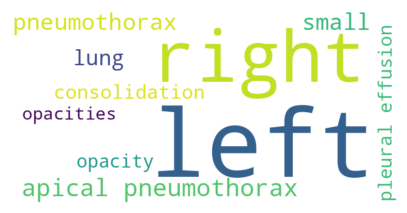

==================== Bin 3 (0.461-0.692)


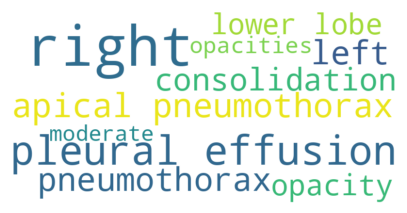

==================== Bin 4 (0.692-0.922)


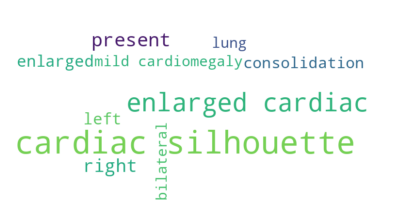

In [166]:
plot_wordclouds_per_bin(
    sentences=tmp['phrases'],
    scores=tmp['ious'],
    num_bins=4,
    figsize=(5,5),
    num_words=10
)

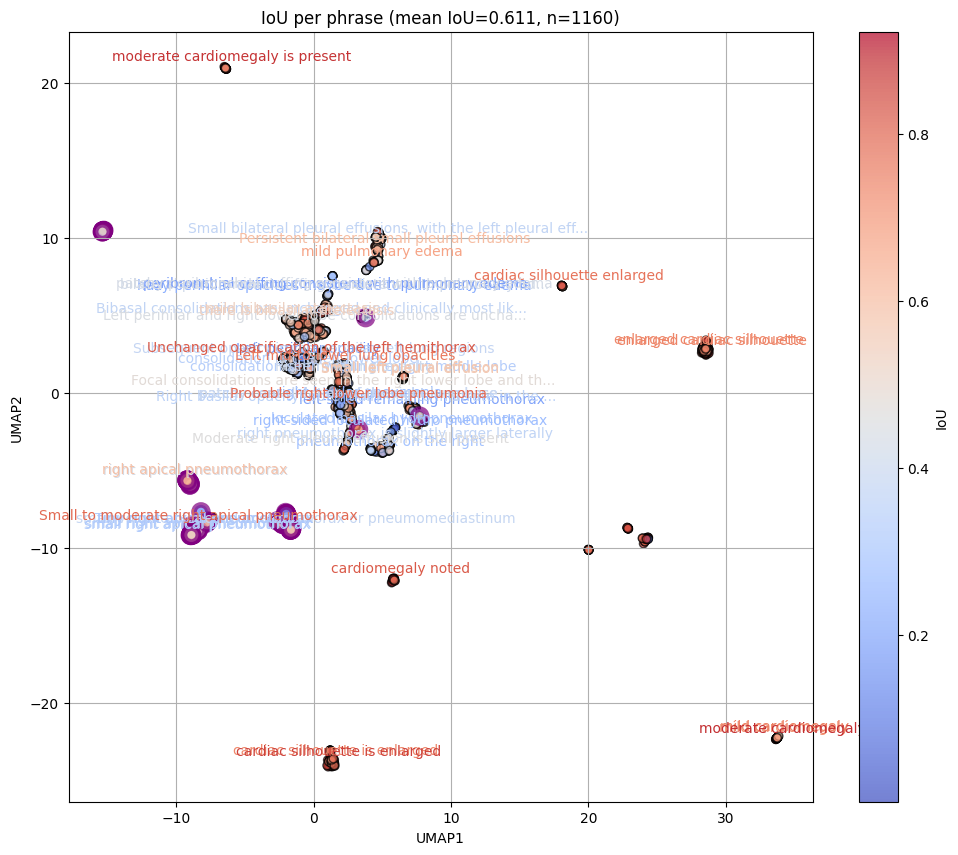

moderate cardiomegaly (0.885, idx=566)
moderate cardiomegaly is present (0.876, idx=605)
cardiac silhouette is enlarged (0.856, idx=816)
Unchanged opacification of the left hemithorax (0.815, idx=595)
cardiomegaly noted (0.815, idx=477)
Probable right lower lobe pneumonia (0.791, idx=346)
Small to moderate right apical pneumothorax (0.791, idx=339)
cardiac silhouette enlarged (0.772, idx=639)
Left mid-to-lower lung opacities (0.762, idx=197)
mild cardiomegaly (0.748, idx=519)
enlarged cardiac silhouette (0.739, idx=561)
enlarged cardiac silhouette (0.730, idx=859)
cardiac silhouette is enlarged (0.730, idx=1073)
mild cardiomegaly (0.708, idx=420)
mild pulmonary edema (0.667, idx=780)
Persistent bilateral small pleural effusions (0.599, idx=216)
right apical pneumothorax (0.589, idx=295)
Small left pleural effusion (0.569, idx=370)
Small left pleural effusion (0.560, idx=451)
there is bibasilar atelectasis (0.536, idx=688)
mild bibasilar atelectasis (0.527, idx=1085)
Focal consolidation

In [176]:
plot_embeddings_sentences_and_scores(
    embeddings=[phrase2embedding[x] for x in tmp['phrases']],
    sentences=tmp['phrases'],
    scores=tmp['ious'],
    title='IoU per phrase',
    score_name='IoU',
    num_annotations=50,
    figsize=(12, 10),
    sentence_max_length=60,
    sample_more_from_low_scores=True,
    highlight_points_with_sentences_containing='apical',
    use_umap=True,
)

In [18]:
pgav = PhraseGroundingAnnotationsVisualizer()

In [16]:
# i = -1
# idx = idxs[i]
idx = 236
print(tmp['ious'][idx])
print()
print(tmp['image_paths'][idx])
print()
print(tmp['phrases'][idx])

dicom_id = tmp['image_paths'][idx].split('/')[-1].split('.')[0]

0.5528247356414795

/mnt/workspace/mimic-cxr-jpg/images-medium(512)/p10/p10550799/s51294166/021cf26b-cd5779dd-8a839d8a-92ede30b-41c1f997.jpg

Bibasilar consolidations appear slightly worse, particularly on the right. This is consistent with multifocal pneumonia


Found 2 rows for dicom_id 021cf26b-cd5779dd-8a839d8a-92ede30b-41c1f997
Image path: /mnt/data/mimic-cxr-jpg/images/p10/p10550799/s51294166/021cf26b-cd5779dd-8a839d8a-92ede30b-41c1f997.jpg
Label text: Bibasilar consolidations appear slightly worse, particularly on the right. This is consistent with multifocal pneumonia
Category name: Pneumonia
x: 428, y: 1763, w: 679, h: 616
Label text: Bibasilar consolidations appear slightly worse, particularly on the right. This is consistent with multifocal pneumonia
Category name: Pneumonia
x: 1370, y: 1810, w: 683, h: 632


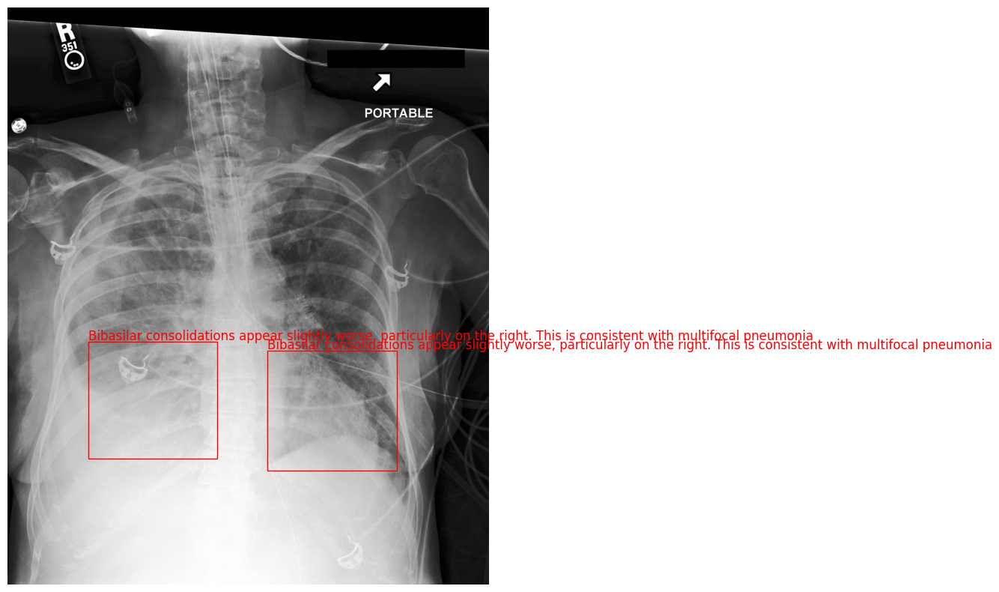

In [19]:
pgav.visualize_dicom_id(dicom_id)

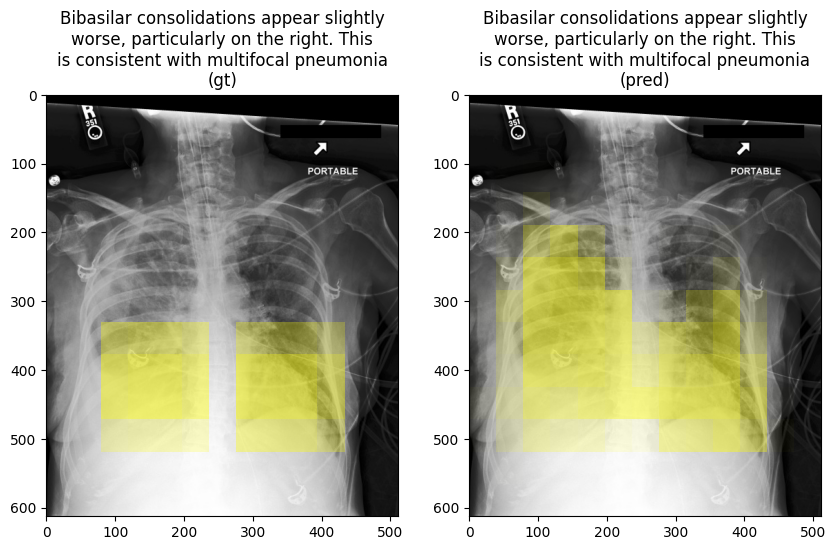

In [22]:
visualize_attention_maps(
    image_path=tmp['image_paths'][idx],
    figsize=(10,10),
    attention_factor=0.5,
    attention_maps=[
        tmp['gt_masks'][idx].reshape(13,13),
        tmp['pred_masks'][idx].reshape(13,13),
    ],
    titles=[
        f"{tmp['phrases'][idx]} (gt)",
        f"{tmp['phrases'][idx]} (pred)",
    ],
)

# 2) Phrase Grounding: DenseNet121 + CXRFE + Transformer Encoder

In [88]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240618_093614_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,TransformerEncoder,128,256,4,512,3)" \
--max_images_per_batch 100 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--mscxr_phrase2embedding_filepath \
"/mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3206715123524916204).pkl" \
--eval_mscxr

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240618_093614_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,TransformerEncoder,128,256,4,512,3)
   max_images_per_batch: 100
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 0
   device: GPU
   mscxr_phrase2embedding_filepath: /mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3206715123524916204).pkl
   eval_chest_imagenome_gold: False
   eval_mscxr: True
----- Evaluating model -----
metadata loaded from /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240618_093614_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,TransformerEncoder,128,256,4,512,3)/metadata.json
--------------------------------------------------
1) device = cuda
--------------------------------------------------
2) Creating instance of PhraseGrounder ...
MultiPurposeVisualModule()
  Initiali

In [90]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240619_114746_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,TransformerEncoder,128,256,2,512,2)" \
--max_images_per_batch 100 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--mscxr_phrase2embedding_filepath \
"/mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3206715123524916204).pkl" \
--eval_mscxr

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240619_114746_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,TransformerEncoder,128,256,2,512,2)
   max_images_per_batch: 100
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 0
   device: GPU
   mscxr_phrase2embedding_filepath: /mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3206715123524916204).pkl
   eval_chest_imagenome_gold: False
   eval_mscxr: True
----- Evaluating model -----
metadata loaded from /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240619_114746_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,TransformerEncoder,128,256,2,512,2)/metadata.json
--------------------------------------------------
1) device = cuda
--------------------------------------------------
2) Creating instance of PhraseGrounder ...
MultiPurposeVisualModule()
  Initiali

In [91]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240619_155740_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,TransformerEncoder,128,256,1,512,1)" \
--max_images_per_batch 100 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--mscxr_phrase2embedding_filepath \
"/mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3206715123524916204).pkl" \
--eval_mscxr

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240619_155740_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,TransformerEncoder,128,256,1,512,1)
   max_images_per_batch: 100
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 0
   device: GPU
   mscxr_phrase2embedding_filepath: /mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3206715123524916204).pkl
   eval_chest_imagenome_gold: False
   eval_mscxr: True
----- Evaluating model -----
metadata loaded from /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240619_155740_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,TransformerEncoder,128,256,1,512,1)/metadata.json
--------------------------------------------------
1) device = cuda
--------------------------------------------------
2) Creating instance of PhraseGrounder ...
MultiPurposeVisualModule()
  Initiali

In [96]:
tmp2 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20240619_155740_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,TransformerEncoder,128,256,1,512,1)/mscxr_metrics.pkl')

In [177]:
tmp = tmp2

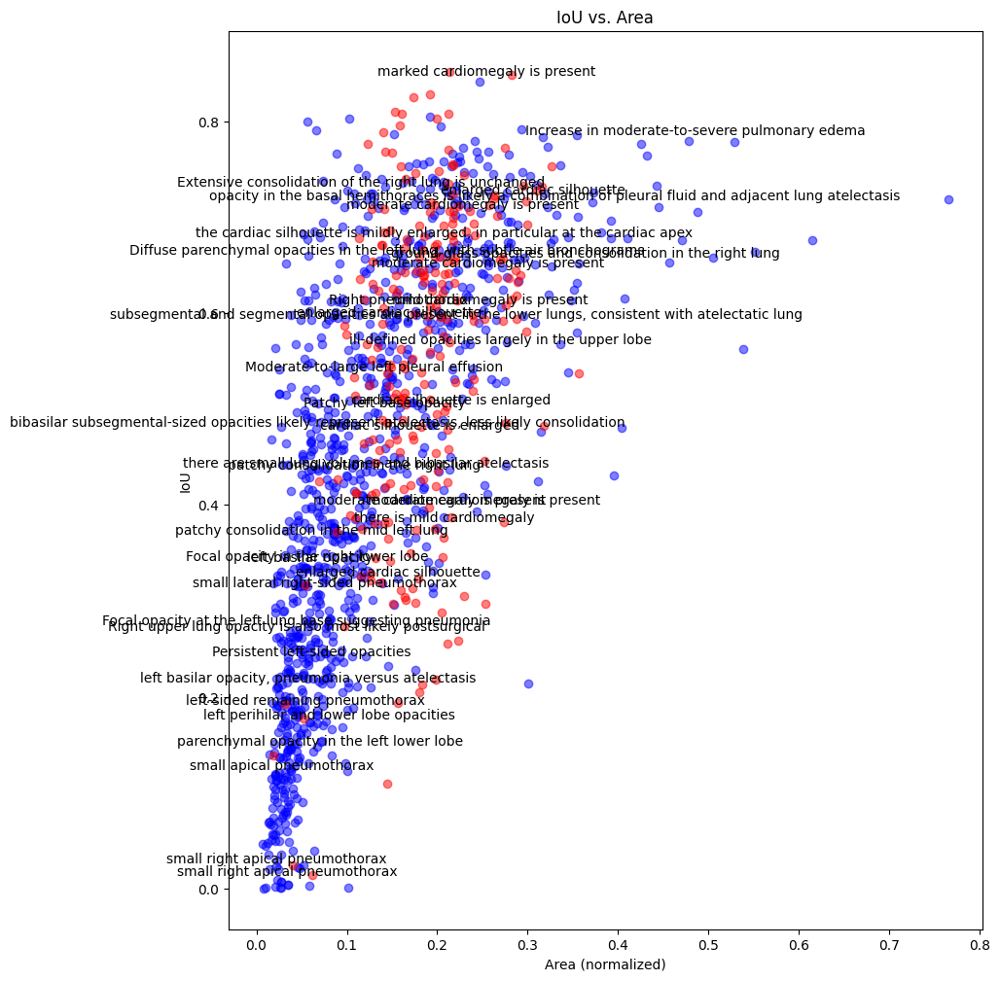

(IoU=0.841, area=0.247, idx=872) marked cardiomegaly is present
(IoU=0.779, area=0.478, idx=1137) Increase in moderate-to-severe pulmonary edema
(IoU=0.725, area=0.108, idx=1127) Extensive consolidation of the right lung is unchanged
(IoU=0.717, area=0.299, idx=805) enlarged cardiac silhouette
(IoU=0.711, area=0.322, idx=1027) opacity in the basal hemithoraces is likely a combination of pleural fluid and adjacent lung atelectasis
(IoU=0.702, area=0.220, idx=880) moderate cardiomegaly is present
(IoU=0.672, area=0.200, idx=1108) the cardiac silhouette is mildly enlarged, in particular at the cardiac apex
(IoU=0.655, area=0.137, idx=452) Diffuse parenchymal opacities in the left lung, with subtle air bronchograms
(IoU=0.651, area=0.357, idx=606) ground-glass opacities and consolidation in the right lung
(IoU=0.641, area=0.249, idx=585) moderate cardiomegaly is present
(IoU=0.603, area=0.149, idx=244) Right pneumothorax
(IoU=0.603, area=0.251, idx=1159) mild cardiomegaly is present
(IoU=0

In [178]:
plot_segmentation_mask_area_vs_iou(
    masks_array=tmp['gt_masks'],
    iou_array=tmp['ious'],
    normalize_area=True,
    sentences=tmp['phrases'],
    num_annotations=40,
    figsize=(10, 12),
    highlight_points_with_sentences_containing='cardiac',
)

==================== Bin 1 (0.000-0.213)


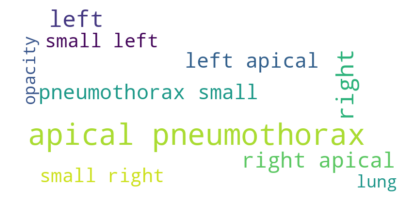

==================== Bin 2 (0.213-0.426)


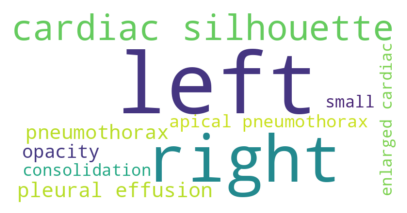

==================== Bin 3 (0.426-0.639)


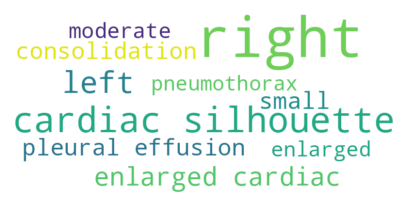

==================== Bin 4 (0.639-0.852)


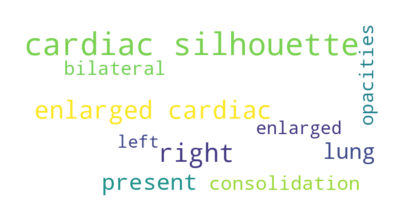

In [179]:
plot_wordclouds_per_bin(
    sentences=tmp['phrases'],
    scores=tmp['ious'],
    num_bins=4,
    figsize=(5,5),
    num_words=10
)

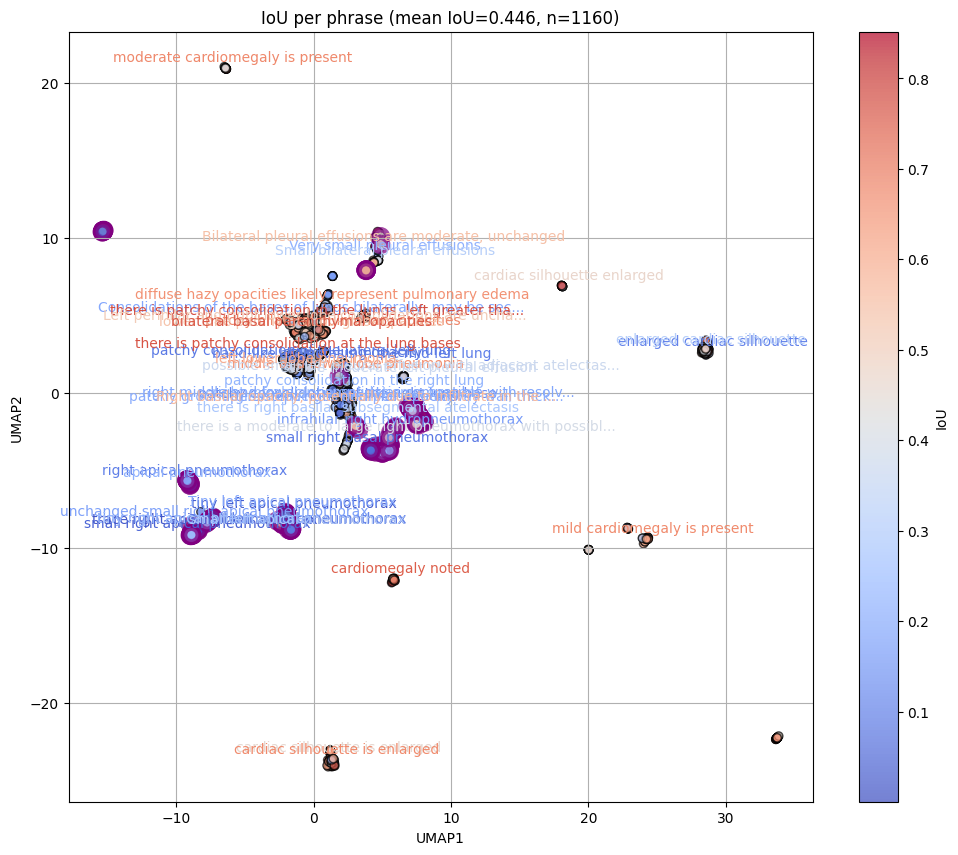

there is patchy consolidation in the lungs, left greater than right (0.773, idx=469)
there is patchy consolidation at the lung bases (0.763, idx=632)
bilateral basal parenchymal opacities (0.758, idx=73)
cardiomegaly noted (0.745, idx=915)
patchy bilateral pulmonary opacities (0.676, idx=282)
moderate cardiomegaly is present (0.673, idx=685)
cardiac silhouette is enlarged (0.670, idx=651)
mild cardiomegaly is present (0.670, idx=886)
middle and lower lobe pneumonia (0.662, idx=196)
diffuse hazy opacities likely represent pulmonary edema (0.653, idx=1021)
left lower lobe pneumonia (0.595, idx=115)
Right basilar opacity, potentially due to infiltrate in the proper clinical setting (0.564, idx=413)
Bilateral pleural effusions are moderate, unchanged (0.545, idx=723)
lower lobe patchy ground-glass opacities (0.535, idx=507)
Left perihilar and right lower lobe consolidations are unchanged.  (0.508, idx=542)
cardiac silhouette enlarged (0.468, idx=700)
cardiac silhouette is enlarged (0.454, 

In [181]:
plot_embeddings_sentences_and_scores(
    embeddings=[phrase2embedding[x] for x in tmp['phrases']],
    sentences=tmp['phrases'],
    scores=tmp['ious'],
    title='IoU per phrase',
    score_name='IoU',
    num_annotations=50,
    figsize=(12, 10),
    sentence_max_length=60,
    sample_more_from_low_scores=True,
    use_umap=True,
    highlight_points_with_sentences_containing='pneumothorax',
)

In [183]:
# i = -1
# idx = idxs[i]
# idx = 843
idx = 469
print(tmp['ious'][idx])
print()
print(tmp['image_paths'][idx])
print()
print(tmp['phrases'][idx])

dicom_id = tmp['image_paths'][idx].split('/')[-1].split('.')[0]

0.7725787162780762

/mnt/workspace/mimic-cxr-jpg/images-medium(512)/p12/p12593920/s57495887/543ddf75-b40274a0-27806ef2-e0231e20-9a290d39.jpg

there is patchy consolidation in the lungs, left greater than right


Found 3 rows for dicom_id 543ddf75-b40274a0-27806ef2-e0231e20-9a290d39
Image path: /mnt/data/mimic-cxr-jpg/images/p12/p12593920/s57495887/543ddf75-b40274a0-27806ef2-e0231e20-9a290d39.jpg
Label text: there is patchy consolidation in the lungs, left greater than right
Category name: Consolidation
x: 2065, y: 858, w: 707, h: 1241
Label text: there is patchy consolidation in the lungs, left greater than right
Category name: Consolidation
x: 509, y: 748, w: 305, h: 518
Label text: there is patchy consolidation in the lungs, left greater than right
Category name: Consolidation
x: 532, y: 1342, w: 661, h: 578


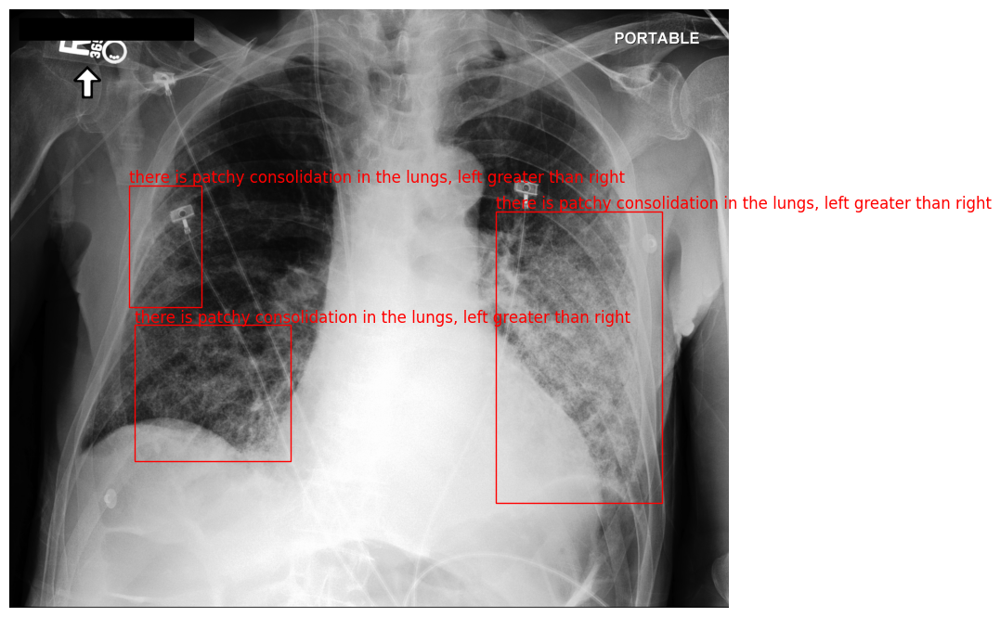

In [184]:
pgav.visualize_dicom_id(dicom_id)

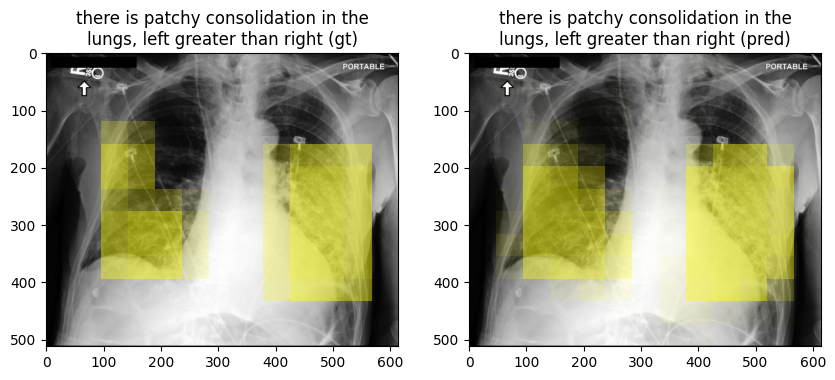

In [185]:
visualize_attention_maps(
    image_path=tmp['image_paths'][idx],
    figsize=(10,10),
    attention_factor=0.5,
    attention_maps=[
        tmp['gt_masks'][idx].reshape(13,13),
        tmp['pred_masks'][idx].reshape(13,13),
    ],
    titles=[
        f"{tmp['phrases'][idx]} (gt)",
        f"{tmp['phrases'][idx]} (pred)",
    ],
)

# 3) Phrase Grounding: DenseNet121 + CXRFE + FiLM-based attention

In [192]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240705_131322_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,FiLM_SigmoidAttention,128,256,256,256,1,256-128)" \
--max_images_per_batch 100 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--mscxr_phrase2embedding_filepath \
"/mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3206715123524916204).pkl" \
--eval_mscxr

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240705_131322_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,FiLM_SigmoidAttention,128,256,256,256,1,256-128)
   max_images_per_batch: 100
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 0
   device: GPU
   mscxr_phrase2embedding_filepath: /mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3206715123524916204).pkl
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
----- Evaluating model -----
metadata loaded from /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240705_131322_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,FiLM_SigmoidAttention,128,256,256,256,1,256-128)/metadata.json
--------------------------------------------------
1) device = cuda
--------------------------------------------------
2) C

In [193]:
tmp3 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20240705_131322_mscxr+chst-img-anat+vinbig+chexloc_PhraseGrounder(dn121,FiLM_SigmoidAttention,128,256,256,256,1,256-128)/mscxr_metrics.pkl')

In [194]:
tmp = tmp3
tmp.keys()

dict_keys(['image_paths', 'phrases', 'pred_masks', 'gt_masks', 'ious', 'segmask_iou'])

In [195]:
idxs = np.argsort(tmp['ious'])[::-1]

In [249]:
i = -300
idx = idxs[i]
idx = 843
# idx = 469
print(tmp['ious'][idx])
print()
print(tmp['image_paths'][idx])
print()
print(tmp['phrases'][idx])

dicom_id = tmp['image_paths'][idx].split('/')[-1].split('.')[0]

0.445512980222702

/mnt/workspace/mimic-cxr-jpg/images-medium(512)/p18/p18910060/s54976912/4aff4e09-0a9a3659-30bd8a5a-f8c582bb-99fa4c27.jpg

patchy ground-glass opacity at the left lung base


Found 1 rows for dicom_id 4aff4e09-0a9a3659-30bd8a5a-f8c582bb-99fa4c27
Image path: /mnt/data/mimic-cxr-jpg/images/p18/p18910060/s54976912/4aff4e09-0a9a3659-30bd8a5a-f8c582bb-99fa4c27.jpg
Label text: patchy ground-glass opacity at the left lung base
Category name: Lung Opacity
x: 1602, y: 1092, w: 219, h: 295


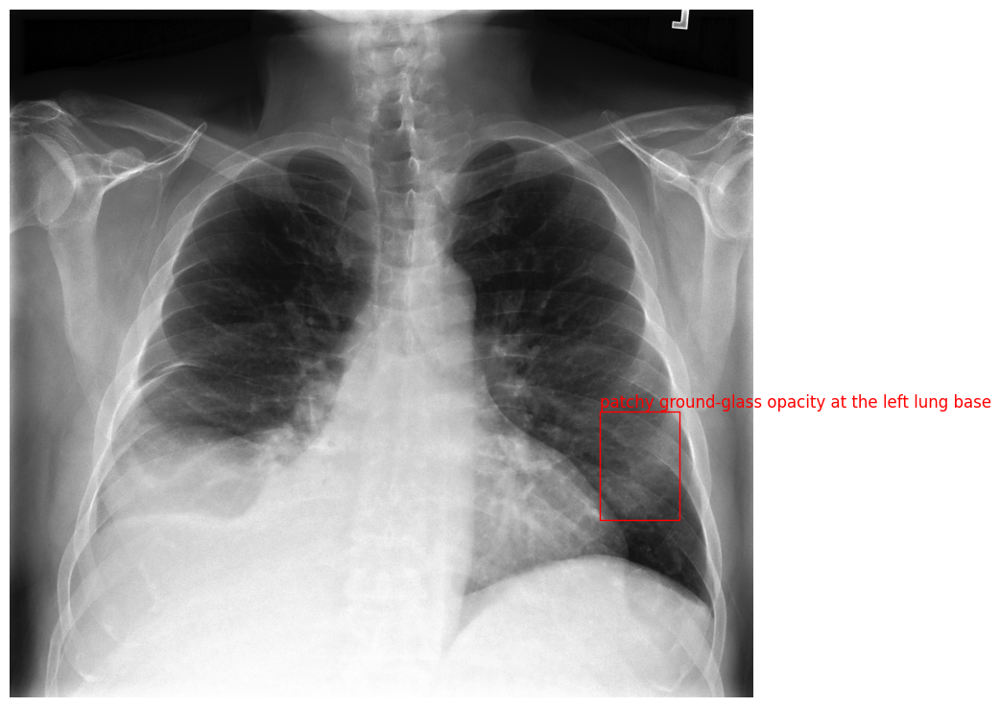

In [251]:
pgav.visualize_dicom_id(dicom_id)

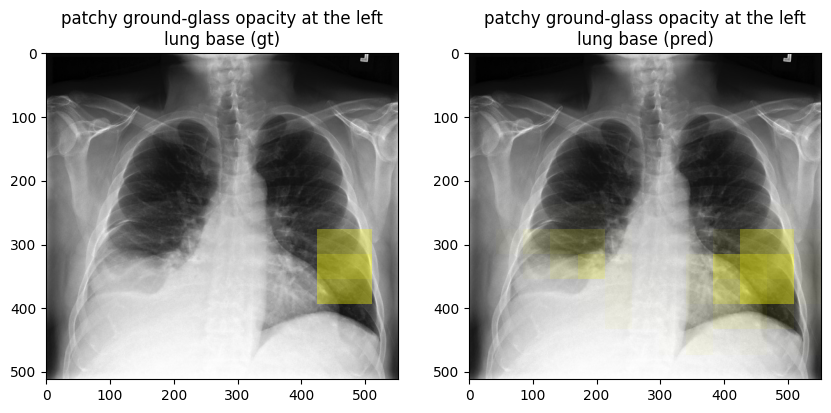

In [252]:
visualize_attention_maps(
    image_path=tmp['image_paths'][idx],
    figsize=(10,10),
    attention_factor=0.5,
    attention_maps=[
        tmp['gt_masks'][idx].reshape(13,13),
        tmp['pred_masks'][idx].reshape(13,13),
    ],
    titles=[
        f"{tmp['phrases'][idx]} (gt)",
        f"{tmp['phrases'][idx]} (pred)",
    ],
)

# 4) Other models

In [7]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240805_102509_mim-facts+chst-img-anat+cxrlt2024(Off)+cxrlt2024(GPT4)+vinbig+chexloc+chxp+iuxray_PhraseGrounder(facebook-convnext-small-224,FiLM_SigmoidAttention,128,256,256,256,1,256-128)" \
--max_images_per_batch 100 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--mscxr_phrase2embedding_filepath \
"/mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3567052674817879091).pkl" \
--eval_mscxr

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240805_102509_mim-facts+chst-img-anat+cxrlt2024(Off)+cxrlt2024(GPT4)+vinbig+chexloc+chxp+iuxray_PhraseGrounder(facebook-convnext-small-224,FiLM_SigmoidAttention,128,256,256,256,1,256-128)
   max_images_per_batch: 100
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 0
   device: GPU
   mscxr_phrase2embedding_filepath: /mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3567052674817879091).pkl
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
----- Evaluating model -----
metadata loaded from /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240805_102509_mim-facts+chst-img-anat+cxrlt2024(Off)+cxrlt2024(GPT4)+vinbig+chexloc+chxp+iuxray_PhraseGrounder(facebook-convnext-small-224,FiLM_SigmoidAttention,128,256,256,256,1,256-128)

In [14]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240805_094953_mim-facts+chst-img-anat+cxrlt2024(Off)+cxrlt2024(GPT4)+vinbig+chexloc+chxp+iuxray_PhraseGrounder(dn121,FiLM_SigmoidAttention,128,256,256,256,1,256-128)" \
--max_images_per_batch 100 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--mscxr_phrase2embedding_filepath \
"/mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3567052674817879091).pkl" \
--eval_mscxr

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240805_094953_mim-facts+chst-img-anat+cxrlt2024(Off)+cxrlt2024(GPT4)+vinbig+chexloc+chxp+iuxray_PhraseGrounder(dn121,FiLM_SigmoidAttention,128,256,256,256,1,256-128)
   max_images_per_batch: 100
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 0
   device: GPU
   mscxr_phrase2embedding_filepath: /mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3567052674817879091).pkl
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: None
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: None
   candidate_conf_thresholds: None
   map_iou_thresholds: [0.0, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
   use_amp: False
   use_classifier_confs_for_map

In [15]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240803_214104_mim-facts+chst-img-anat+cxrlt2024(Off)+cxrlt2024(GPT4)+vinbig+chexloc+chxp+iuxray_PhraseGrounder(microsoft-rad-dino,FiLM_SigmoidAttention,128,256,256,256,1,256-128)" \
--max_images_per_batch 100 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--mscxr_phrase2embedding_filepath \
"/mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3567052674817879091).pkl" \
--eval_mscxr

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240803_214104_mim-facts+chst-img-anat+cxrlt2024(Off)+cxrlt2024(GPT4)+vinbig+chexloc+chxp+iuxray_PhraseGrounder(microsoft-rad-dino,FiLM_SigmoidAttention,128,256,256,256,1,256-128)
   max_images_per_batch: 100
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 0
   device: GPU
   mscxr_phrase2embedding_filepath: /mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3567052674817879091).pkl
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: None
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: None
   candidate_conf_thresholds: None
   map_iou_thresholds: [0.0, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
   use_amp: False
   use_classifier_

In [10]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240825_115146_mim-facts+chst-img-anat+cxrlt2024(Off)+cxrlt2024(GPT4)+vinbig+chexloc+chxp+iuxray_PhraseGrounder(aehrc-cxrmate-rrg24,FiLM_SigmoidAttention,128,256,256,256,1,256-128)" \
--max_images_per_batch 100 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--mscxr_phrase2embedding_filepath \
"/mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3567052674817879091).pkl" \
--eval_mscxr

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240825_115146_mim-facts+chst-img-anat+cxrlt2024(Off)+cxrlt2024(GPT4)+vinbig+chexloc+chxp+iuxray_PhraseGrounder(aehrc-cxrmate-rrg24,FiLM_SigmoidAttention,128,256,256,256,1,256-128)
   max_images_per_batch: 100
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 0
   device: GPU
   mscxr_phrase2embedding_filepath: /mnt/workspace/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36521,3567052674817879091).pkl
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
----- Evaluating model -----
metadata loaded from /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20240825_115146_mim-facts+chst-img-anat+cxrlt2024(Off)+cxrlt2024(GPT4)+vinbig+chexloc+chxp+iuxray_PhraseGrounder(aehrc-cxrmate-rrg24,FiLM_SigmoidAttention,128,256,256,256,1,256-128)/metadata.json
-

# 5) Newer experiments

In [112]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--eval_mscxr \
--num_workers 2 \
--max_images_per_batch 200 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--candidate_iou_thresholds 0.05 0.1 0.2 0.3 0.4 0.5 \
--candidate_conf_thresholds 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   max_images_per_batch: 200
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 2
   device: GPU
   mscxr_phrase2embedding_filepath: None
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: None
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
   candidate_conf_thresholds: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
   map_iou_thresholds: [0.0, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
   use_amp: False
   use_classifier_confs_for_map: False
Activating determinism(seed=42)...
----- Evaluating model -----
metadata lo

Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 7280.08it/s]
Test IoU with bootstrapping:
{'iou': {'mean': 0.303583096478836, 'std': 0.016653347596686418},
 'iou(Atelectasis)': {'mean': 0.26138291840021205, 'std': 0.020906690950092673},
 'iou(Cardiomegaly)': {'mean': 0.5376295624715546, 'std': 0.02897486789083425},
 'iou(Consolidation)': {'mean': 0.2811486745829205,
                        'std': 0.039802259290627334},
 'iou(Edema)': {'mean': 0.3132923010552108, 'std': 0.07336285944008591},
 'iou(Lung Opacity)': {'mean': 0.10064435386398095,
                       'std': 0.013158588935702877},
 'iou(Pleural Effusion)': {'mean': 0.3068760638416753,
                           'std': 0.04897345384069339},
 'iou(Pneumonia)': {'mean': 0.1868884641504889, 'std': 0.021959882365389524},
 'iou(Pneumothorax)': {'mean': 0.1438390847691133, 'std': 0.021103996485126675}}
Finding optimal IoU and conf thresholds for IoU based on bounding box coordinates on the train set ...
Optimi

Bootstrapping: 100%|███████████████████████| 500/500 [00:00<00:00, 10461.07it/s]
Val Avg Classification Prob with bootstrapping:
{'avg_classification_prob': {'mean': 0.6593517, 'std': 0.020205935},
 'avg_classification_prob(Atelectasis)': {'mean': 0.53712356,
                                          'std': 0.070758216},
 'avg_classification_prob(Cardiomegaly)': {'mean': 0.73541546,
                                           'std': 0.03372864},
 'avg_classification_prob(Consolidation)': {'mean': 0.45750564,
                                            'std': 0.04320069},
 'avg_classification_prob(Edema)': {'mean': 0.5907418, 'std': 0.10678552},
 'avg_classification_prob(Lung Opacity)': {'mean': 0.569077,
                                           'std': 0.091601975},
 'avg_classification_prob(Pleural Effusion)': {'mean': 0.7985465,
                                               'std': 0.051468365},
 'avg_classification_prob(Pneumonia)': {'mean': 0.56706446, 'std': 0.043632526},
 'avg_cl

In [113]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_115427_mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--eval_mscxr \
--num_workers 2 \
--max_images_per_batch 200 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--candidate_iou_thresholds 0.05 0.1 0.2 0.3 0.4 0.5 \
--candidate_conf_thresholds 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_115427_mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   max_images_per_batch: 200
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 2
   device: GPU
   mscxr_phrase2embedding_filepath: None
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: None
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
   candidate_conf_thresholds: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
   map_iou_thresholds: [0.0, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
   use_amp: False
   use_classifier_confs_for_map: False
Activating determinism(seed=42)...
----- Evaluating model -----
metadata loaded from 

Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 4653.81it/s]
Val Avg Classification Prob with bootstrapping:
{'avg_classification_prob': {'mean': 0.652599, 'std': 0.023534346},
 'avg_classification_prob(Atelectasis)': {'mean': 0.4901562,
                                          'std': 0.104552396},
 'avg_classification_prob(Cardiomegaly)': {'mean': 0.746464,
                                           'std': 0.039786175},
 'avg_classification_prob(Consolidation)': {'mean': 0.38804528,
                                            'std': 0.050905623},
 'avg_classification_prob(Edema)': {'mean': 0.6983525, 'std': 0.10925566},
 'avg_classification_prob(Lung Opacity)': {'mean': 0.57036424,
                                           'std': 0.092075884},
 'avg_classification_prob(Pleural Effusion)': {'mean': 0.82776743,
                                               'std': 0.040928565},
 'avg_classification_prob(Pneumonia)': {'mean': 0.5434415, 'std': 0.05634143},
 'avg_cla

In [114]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_092924_mscxr_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--eval_mscxr \
--num_workers 2 \
--max_images_per_batch 200 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--candidate_iou_thresholds 0.05 0.1 0.2 0.3 0.4 0.5 \
--candidate_conf_thresholds 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_092924_mscxr_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   max_images_per_batch: 200
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 2
   device: GPU
   mscxr_phrase2embedding_filepath: None
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: None
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
   candidate_conf_thresholds: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
   map_iou_thresholds: [0.0, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
   use_amp: False
   use_classifier_confs_for_map: False
Activating determinism(seed=42)...
----- Evaluating model -----
metadata loaded from /mnt/da

Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 9953.69it/s]
Val Avg Classification Prob with bootstrapping:
{'avg_classification_prob': {'mean': 0.6772445, 'std': 0.021421405},
 'avg_classification_prob(Atelectasis)': {'mean': 0.600705, 'std': 0.10135055},
 'avg_classification_prob(Cardiomegaly)': {'mean': 0.7371954,
                                           'std': 0.043265052},
 'avg_classification_prob(Consolidation)': {'mean': 0.53692454,
                                            'std': 0.06914601},
 'avg_classification_prob(Edema)': {'mean': 0.65992224, 'std': 0.1324506},
 'avg_classification_prob(Lung Opacity)': {'mean': 0.6178935,
                                           'std': 0.09787317},
 'avg_classification_prob(Pleural Effusion)': {'mean': 0.8590409,
                                               'std': 0.04054381},
 'avg_classification_prob(Pneumonia)': {'mean': 0.58599156, 'std': 0.061720442},
 'avg_classification_prob(Pneumothorax)': {'mean': 0.6

In [1]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250217_111607_vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--eval_mscxr \
--num_workers 2 \
--max_images_per_batch 200 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--candidate_iou_thresholds 0.05 0.1 0.2 0.3 0.4 0.5 \
--candidate_conf_thresholds 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 \
--checkpoint_folder_path_to_borrow_metadata_from "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)"

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250217_111607_vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   max_images_per_batch: 200
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 2
   device: GPU
   mscxr_phrase2embedding_filepath: None
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
   candidate_conf_thresholds: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
   map_iou_thresholds: [

Optimizing threshold: 100%|███████████████████████| 8/8 [00:02<00:00,  2.97it/s]
{'best_iou': 0.13737485090084298, 'best_conf_th': 0.1}
Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 7826.10it/s]
Test IoU with bootstrapping:
{'iou': {'mean': 0.1372608495917812, 'std': 0.011395996723425785},
 'iou(Atelectasis)': {'mean': 0.11738560762457646, 'std': 0.029185526397247284},
 'iou(Cardiomegaly)': {'mean': 0.28446596924670264, 'std': 0.02748342008409177},
 'iou(Consolidation)': {'mean': 0.13553332519550768,
                        'std': 0.021966096794057047},
 'iou(Edema)': {'mean': 0.16089024161655321, 'std': 0.06043481238735977},
 'iou(Lung Opacity)': {'mean': 0.040657520679384856,
                       'std': 0.006651598558224685},
 'iou(Pleural Effusion)': {'mean': 0.03775666251742978,
                           'std': 0.019803820897641246},
 'iou(Pneumonia)': {'mean': 0.10503517267873727, 'std': 0.020680193957211383},
 'iou(Pneumothorax)': {'mean': 0.0218454450820

In [52]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250401_191427_mscxr_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--eval_mscxr \
--num_workers 2 \
--max_images_per_batch 200 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--candidate_iou_thresholds 0.05 0.1 0.2 0.3 0.4 0.5 \
--candidate_conf_thresholds 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 \
--checkpoint_folder_path_to_borrow_metadata_from "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--override_bbox_format "cxcywh"

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250401_191427_mscxr_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   max_images_per_batch: 200
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 2
   device: GPU
   mscxr_phrase2embedding_filepath: None
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   override_bbox_format: cxcywh
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
   candidate_conf_thresholds: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7

Optimizing threshold: 100%|███████████████████████| 8/8 [00:03<00:00,  2.26it/s]
{'best_iou': 0.5637247167297621, 'best_conf_th': 0.8}
Bootstrapping: 100%|███████████████████████| 500/500 [00:00<00:00, 10969.11it/s]
Test IoU with bootstrapping:
{'iou': {'mean': 0.5640829666047243, 'std': 0.00987939024160767},
 'iou(Atelectasis)': {'mean': 0.5796717367316125, 'std': 0.0342573815412075},
 'iou(Cardiomegaly)': {'mean': 0.6726936077104294, 'std': 0.009495932825066151},
 'iou(Consolidation)': {'mean': 0.5771994230510065,
                        'std': 0.029439799313598327},
 'iou(Edema)': {'mean': 0.5370788450619318, 'std': 0.03933270844141592},
 'iou(Lung Opacity)': {'mean': 0.46696177091793534, 'std': 0.03320605837466147},
 'iou(Pleural Effusion)': {'mean': 0.4998359251383885,
                           'std': 0.022568009097679524},
 'iou(Pneumonia)': {'mean': 0.5503073111214055, 'std': 0.023702224489665923},
 'iou(Pneumothorax)': {'mean': 0.47252208163753673,
                       'std'

Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 9009.55it/s]
Val Avg Classification Prob with bootstrapping:
{'avg_classification_prob': {'mean': 0.9993307, 'std': 0.00014404082},
 'avg_classification_prob(Atelectasis)': {'mean': 0.9998601,
                                          'std': 5.1976986e-05},
 'avg_classification_prob(Cardiomegaly)': {'mean': 0.99995446,
                                           'std': 1.5808015e-05},
 'avg_classification_prob(Consolidation)': {'mean': 0.99830556,
                                            'std': 0.0010077271},
 'avg_classification_prob(Edema)': {'mean': 0.999843, 'std': 5.0063132e-05},
 'avg_classification_prob(Lung Opacity)': {'mean': 0.99776417,
                                           'std': 0.0009693481},
 'avg_classification_prob(Pleural Effusion)': {'mean': 0.9998799,
                                               'std': 4.572872e-05},
 'avg_classification_prob(Pneumonia)': {'mean': 0.9995315,
                

In [53]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250406_081849_mscxr_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--eval_mscxr \
--num_workers 2 \
--max_images_per_batch 200 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--candidate_iou_thresholds 0.05 0.1 0.2 0.3 0.4 0.5 \
--candidate_conf_thresholds 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 \
--checkpoint_folder_path_to_borrow_metadata_from "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--override_bbox_format "cxcywh"

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250406_081849_mscxr_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   max_images_per_batch: 200
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 2
   device: GPU
   mscxr_phrase2embedding_filepath: None
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   override_bbox_format: cxcywh
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
   candidate_conf_thresholds: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7

Optimizing threshold: 100%|███████████████████████| 8/8 [00:03<00:00,  2.30it/s]
{'best_iou': 0.489205761555627, 'best_conf_th': 0.8}
Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 8355.59it/s]
Test IoU with bootstrapping:
{'iou': {'mean': 0.4889977733061537, 'std': 0.0145314297005387},
 'iou(Atelectasis)': {'mean': 0.4129466811467126, 'std': 0.06985943466863306},
 'iou(Cardiomegaly)': {'mean': 0.6425527676760688, 'std': 0.012849538408822511},
 'iou(Consolidation)': {'mean': 0.4919542923095979, 'std': 0.05219384684651394},
 'iou(Edema)': {'mean': 0.39355979795786955, 'std': 0.07491261966176237},
 'iou(Lung Opacity)': {'mean': 0.3955904945824913, 'std': 0.0488736233389043},
 'iou(Pleural Effusion)': {'mean': 0.41227982929533746,
                           'std': 0.03044678160166225},
 'iou(Pneumonia)': {'mean': 0.4820967022249218, 'std': 0.032358514479616594},
 'iou(Pneumothorax)': {'mean': 0.3690067541757505, 'std': 0.03207217319501328}}
Finding optimal IoU and con

Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 8167.40it/s]
Val Avg Classification Prob with bootstrapping:
{'avg_classification_prob': {'mean': 0.98159456, 'std': 0.0063053183},
 'avg_classification_prob(Atelectasis)': {'mean': 0.9781813,
                                          'std': 0.019451227},
 'avg_classification_prob(Cardiomegaly)': {'mean': 0.9999419,
                                           'std': 3.404295e-05},
 'avg_classification_prob(Consolidation)': {'mean': 0.9866018,
                                            'std': 0.0072803106},
 'avg_classification_prob(Edema)': {'mean': 0.99443406, 'std': 0.0033123647},
 'avg_classification_prob(Lung Opacity)': {'mean': 0.9112917,
                                           'std': 0.064504705},
 'avg_classification_prob(Pleural Effusion)': {'mean': 0.99659556,
                                               'std': 0.0026871057},
 'avg_classification_prob(Pneumonia)': {'mean': 0.9747321, 'std': 0.013438082},


In [54]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250409_084600_mscxr_PhraseGrounder(microsoft-rad-dino-maira-2,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/" \
--eval_mscxr \
--num_workers 2 \
--max_images_per_batch 50 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--candidate_iou_thresholds 0.05 0.1 0.2 0.3 0.4 0.5 \
--candidate_conf_thresholds 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 \
--checkpoint_folder_path_to_borrow_metadata_from "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--override_bbox_format "cxcywh"

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250409_084600_mscxr_PhraseGrounder(microsoft-rad-dino-maira-2,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/
   max_images_per_batch: 50
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 2
   device: GPU
   mscxr_phrase2embedding_filepath: None
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   override_bbox_format: cxcywh
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
   candidate_conf_thresholds: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0

Optimizing threshold: 100%|███████████████████████| 8/8 [00:15<00:00,  1.94s/it]
{'best_iou': 0.7434469732020346, 'best_conf_th': 0.8}
Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 3718.82it/s]
Test IoU with bootstrapping:
{'iou': {'mean': 0.7436687828963046, 'std': 0.007351957609915574},
 'iou(Atelectasis)': {'mean': 0.7333442990161352, 'std': 0.024517915027968008},
 'iou(Cardiomegaly)': {'mean': 0.8238367368438134,
                       'std': 0.0054812708720129895},
 'iou(Consolidation)': {'mean': 0.7496311535301439,
                        'std': 0.019214420112074596},
 'iou(Edema)': {'mean': 0.7441019719911317, 'std': 0.030753945332970514},
 'iou(Lung Opacity)': {'mean': 0.6771278751094724, 'std': 0.020146965502605172},
 'iou(Pleural Effusion)': {'mean': 0.7066072896636767,
                           'std': 0.018201296563275286},
 'iou(Pneumonia)': {'mean': 0.7375997228946112, 'std': 0.010685979696995286},
 'iou(Pneumothorax)': {'mean': 0.6680418754624637, '

Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 8449.99it/s]
Val Avg Classification Prob with bootstrapping:
{'avg_classification_prob': {'mean': 0.8299552, 'std': 0.016348874},
 'avg_classification_prob(Atelectasis)': {'mean': 0.91657275,
                                          'std': 0.03877991},
 'avg_classification_prob(Cardiomegaly)': {'mean': 0.94539815,
                                           'std': 0.009660356},
 'avg_classification_prob(Consolidation)': {'mean': 0.84342366,
                                            'std': 0.05270571},
 'avg_classification_prob(Edema)': {'mean': 0.70260066, 'std': 0.08980578},
 'avg_classification_prob(Lung Opacity)': {'mean': 0.8034524,
                                           'std': 0.07504776},
 'avg_classification_prob(Pleural Effusion)': {'mean': 0.9212705,
                                               'std': 0.025247263},
 'avg_classification_prob(Pneumonia)': {'mean': 0.8270869, 'std': 0.030098636},
 'avg_cl

In [51]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250409_060154_mscxr_PhraseGrounder(facebook-convnext-small-224,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/" \
--eval_mscxr \
--num_workers 2 \
--max_images_per_batch 100 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--candidate_iou_thresholds 0.05 0.1 0.2 0.3 0.4 0.5 \
--candidate_conf_thresholds 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 \
--checkpoint_folder_path_to_borrow_metadata_from "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--override_bbox_format "cxcywh"

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250409_060154_mscxr_PhraseGrounder(facebook-convnext-small-224,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/
   max_images_per_batch: 100
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 2
   device: GPU
   mscxr_phrase2embedding_filepath: None
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   override_bbox_format: cxcywh
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
   candidate_conf_thresholds: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7,

Optimizing threshold: 100%|███████████████████████| 8/8 [00:04<00:00,  1.99it/s]
{'best_iou': 0.5781538393292146, 'best_conf_th': 0.8}
Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 8466.06it/s]
Test IoU with bootstrapping:
{'iou': {'mean': 0.5788243070504433, 'std': 0.009460615872818469},
 'iou(Atelectasis)': {'mean': 0.5618694362172071, 'std': 0.025781683735835753},
 'iou(Cardiomegaly)': {'mean': 0.6897926479536693, 'std': 0.009795637162116157},
 'iou(Consolidation)': {'mean': 0.608226536172094, 'std': 0.035586707986359975},
 'iou(Edema)': {'mean': 0.5469654293005686, 'std': 0.03644901046544806},
 'iou(Lung Opacity)': {'mean': 0.48078976360765585, 'std': 0.02808528818606937},
 'iou(Pleural Effusion)': {'mean': 0.5236962287694203,
                           'std': 0.02234157141931746},
 'iou(Pneumonia)': {'mean': 0.5762824205412377, 'std': 0.01659701435583356},
 'iou(Pneumothorax)': {'mean': 0.47020482644916295, 'std': 0.02058004053551797}}
Finding optimal IoU and

Bootstrapping: 100%|███████████████████████| 500/500 [00:00<00:00, 10736.57it/s]
Val Avg Classification Prob with bootstrapping:
{'avg_classification_prob': {'mean': 0.8394391, 'std': 0.011614124},
 'avg_classification_prob(Atelectasis)': {'mean': 0.62476516,
                                          'std': 0.04398904},
 'avg_classification_prob(Cardiomegaly)': {'mean': 0.98492235,
                                           'std': 0.003533133},
 'avg_classification_prob(Consolidation)': {'mean': 0.73112136,
                                            'std': 0.030801777},
 'avg_classification_prob(Edema)': {'mean': 0.7926977, 'std': 0.053624522},
 'avg_classification_prob(Lung Opacity)': {'mean': 0.81748, 'std': 0.043616332},
 'avg_classification_prob(Pleural Effusion)': {'mean': 0.85461336,
                                               'std': 0.025863275},
 'avg_classification_prob(Pneumonia)': {'mean': 0.822176, 'std': 0.025886852},
 'avg_classification_prob(Pneumothorax)': {'mean': 

In [83]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250409_225245_mscxr_PhraseGrounder(facebook-convnext-small-224,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--eval_mscxr \
--num_workers 2 \
--max_images_per_batch 100 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--candidate_iou_thresholds 0.05 0.1 0.2 0.3 0.4 0.5 \
--candidate_conf_thresholds 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 \
--checkpoint_folder_path_to_borrow_metadata_from "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--override_bbox_format "cxcywh"

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250409_225245_mscxr_PhraseGrounder(facebook-convnext-small-224,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   max_images_per_batch: 100
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 2
   device: GPU
   mscxr_phrase2embedding_filepath: None
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   override_bbox_format: cxcywh
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
   candidate_conf_thresholds: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 

Optimizing threshold: 100%|███████████████████████| 8/8 [00:03<00:00,  2.13it/s]
{'best_iou': 0.48253533351827366, 'best_conf_th': 0.8}
Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 4577.29it/s]
Test IoU with bootstrapping:
{'iou': {'mean': 0.48268384479935467, 'std': 0.01565006714030108},
 'iou(Atelectasis)': {'mean': 0.39263890423619224, 'std': 0.0922602050821862},
 'iou(Cardiomegaly)': {'mean': 0.6713534467789926, 'std': 0.012146698547499491},
 'iou(Consolidation)': {'mean': 0.4624488667310439, 'std': 0.05835368346408447},
 'iou(Edema)': {'mean': 0.37025878474848223, 'std': 0.06819101862509526},
 'iou(Lung Opacity)': {'mean': 0.3643123850708708, 'std': 0.033613742727439506},
 'iou(Pleural Effusion)': {'mean': 0.4651504204342608,
                           'std': 0.02921050282889417},
 'iou(Pneumonia)': {'mean': 0.4803019444043114, 'std': 0.02433414538469974},
 'iou(Pneumothorax)': {'mean': 0.3081435173586383, 'std': 0.0341482258547364}}
Finding optimal IoU and 

Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 4430.18it/s]
Val Avg Classification Prob with bootstrapping:
{'avg_classification_prob': {'mean': 0.7633709, 'std': 0.016456},
 'avg_classification_prob(Atelectasis)': {'mean': 0.49364305,
                                          'std': 0.047117162},
 'avg_classification_prob(Cardiomegaly)': {'mean': 0.9827191,
                                           'std': 0.004924884},
 'avg_classification_prob(Consolidation)': {'mean': 0.5991646,
                                            'std': 0.044018105},
 'avg_classification_prob(Edema)': {'mean': 0.6666948, 'std': 0.06646905},
 'avg_classification_prob(Lung Opacity)': {'mean': 0.68437535,
                                           'std': 0.0739792},
 'avg_classification_prob(Pleural Effusion)': {'mean': 0.80151707,
                                               'std': 0.04368748},
 'avg_classification_prob(Pneumonia)': {'mean': 0.69895667, 'std': 0.035932757},
 'avg_class

In [85]:
!python ../eval_phrase_grounding.py \
--checkpoint_folder_path "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250409_224838_mscxr_PhraseGrounder(microsoft-rad-dino-maira-2,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--eval_mscxr \
--num_workers 2 \
--max_images_per_batch 50 \
--max_phrases_per_batch 2000 \
--max_phrases_per_image 30 \
--candidate_iou_thresholds 0.05 0.1 0.2 0.3 0.4 0.5 \
--candidate_conf_thresholds 0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 \
--checkpoint_folder_path_to_borrow_metadata_from "/mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)" \
--override_bbox_format "cxcywh"

script's arguments:
   checkpoint_folder_path: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250409_224838_mscxr_PhraseGrounder(microsoft-rad-dino-maira-2,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   max_images_per_batch: 50
   max_phrases_per_batch: 2000
   max_phrases_per_image: 30
   num_workers: 2
   device: GPU
   mscxr_phrase2embedding_filepath: None
   vinbig_use_training_indices_for_validation: False
   checkpoint_folder_path_to_borrow_metadata_from: /mnt/data/pamessina/workspaces/medvqa-workspace/models/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)
   override_bbox_format: cxcywh
   eval_chest_imagenome_gold: False
   eval_mscxr: True
   eval_chexlocalize: False
   eval_vinbig: False
   optimize_thresholds: False
   candidate_iou_thresholds: [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
   candidate_conf_thresholds: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.

Optimizing threshold: 100%|███████████████████████| 8/8 [00:17<00:00,  2.18s/it]
{'best_iou': 0.5445037935164192, 'best_conf_th': 0.8}
Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 8808.27it/s]
Test IoU with bootstrapping:
{'iou': {'mean': 0.543829918938118, 'std': 0.01593784208612972},
 'iou(Atelectasis)': {'mean': 0.4671875173615094, 'std': 0.09343262973385781},
 'iou(Cardiomegaly)': {'mean': 0.7185077589844573, 'std': 0.013256360644799644},
 'iou(Consolidation)': {'mean': 0.5254479062098086,
                        'std': 0.049513532772823145},
 'iou(Edema)': {'mean': 0.4084505613513748, 'std': 0.07536696185386225},
 'iou(Lung Opacity)': {'mean': 0.4555737634694548, 'std': 0.04012488424160689},
 'iou(Pleural Effusion)': {'mean': 0.464383088329509,
                           'std': 0.031385070369766115},
 'iou(Pneumonia)': {'mean': 0.5045473480255006, 'std': 0.0371176023499259},
 'iou(Pneumothorax)': {'mean': 0.4389675527172522, 'std': 0.03427637321993175}}
Find

Bootstrapping: 100%|████████████████████████| 500/500 [00:00<00:00, 8771.24it/s]
Val Avg Classification Prob with bootstrapping:
{'avg_classification_prob': {'mean': 0.7566057, 'std': 0.020690385},
 'avg_classification_prob(Atelectasis)': {'mean': 0.85682875, 'std': 0.0848323},
 'avg_classification_prob(Cardiomegaly)': {'mean': 0.9288661,
                                           'std': 0.017858166},
 'avg_classification_prob(Consolidation)': {'mean': 0.79082334,
                                            'std': 0.04030097},
 'avg_classification_prob(Edema)': {'mean': 0.6201169, 'std': 0.06271289},
 'avg_classification_prob(Lung Opacity)': {'mean': 0.8334048,
                                           'std': 0.08006237},
 'avg_classification_prob(Pleural Effusion)': {'mean': 0.8387015,
                                               'std': 0.05926127},
 'avg_classification_prob(Pneumonia)': {'mean': 0.72108227, 'std': 0.04993059},
 'avg_classification_prob(Pneumothorax)': {'mean': 0.4

In [132]:
tmp = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20250409_224838_mscxr_PhraseGrounder(microsoft-rad-dino-maira-2,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/mscxr_metrics.pkl')

In [133]:
tmp.keys()

dict_keys(['train_preds_and_gt', 'val_preds_and_gt', 'test_preds_and_gt', 'train_iou_with_boostrapping', 'val_iou_with_boostrapping', 'test_iou_with_boostrapping', 'train_iou_with_boostrapping_2', 'val_iou_with_boostrapping_2', 'test_iou_with_boostrapping_2', 'train_avg_classification_prob_with_bootstrappig', 'val_avg_classification_prob_with_bootstrappig', 'test_avg_classification_prob_with_bootstrappig', 'train_best_conf_th', 'val_best_conf_th', 'test_best_conf_th', 'train_best_iou_th_2', 'val_best_iou_th_2', 'test_best_iou_th_2', 'train_best_conf_th_2', 'val_best_conf_th_2', 'test_best_conf_th_2', 'train_best_pre_nms_max_det_2', 'val_best_pre_nms_max_det_2', 'test_best_pre_nms_max_det_2', 'train_best_post_nms_max_det_2', 'val_best_post_nms_max_det_2', 'test_best_post_nms_max_det_2'])

In [70]:
phrase_to_embedding = load_pickle("/mnt/data/pamessina_folder_backup_15_10_24/pamessina/medvqa-workspace/cache/mimiccxr/mscxr_phrase2embedding(hash=36549,2076639799495206637).pkl")
dicom_id_to_pos_neg_facts = load_pickle("/mnt/workspace/pamessina/cache/mimiccxr_dicom_id_to_pos_neg_facts_with_GPT4_mined_labels(nf=403416,nl=28,ngpt4=87528)(hash=741,3592138487644435704).pkl")

In [74]:
dicom_id_to_pos_neg_facts.keys()

dict_keys(['facts', 'embeddings', 'dicom_id_to_pos_facts', 'dicom_id_to_strong_neg_facts', 'dicom_id_to_weak_neg_facts'])

In [82]:
import numpy as np
sorted_idxs = np.argsort(tmp['test_preds_and_gt']['ious'])

In [102]:
idx = sorted_idxs[31]
qq = tmp['test_preds_and_gt']['phrases'][idx]
print(tmp['test_preds_and_gt']['ious'][idx])
print(qq)

0.08025308969940012
There is probably small left effusion


In [105]:
from medvqa.utils.math import rank_vectors_by_dot_product
import numpy as np

# q = 'AP chest compared to DEID: Left lower lobe collapse is new'
q = qq
qe = phrase_to_embedding[q]

idxs = rank_vectors_by_dot_product(dicom_id_to_pos_neg_facts['embeddings'], qe)
print(q)
print()
for i in range(20):
    idx = idxs[i]
    print(np.dot(dicom_id_to_pos_neg_facts['embeddings'][idx], qe), dicom_id_to_pos_neg_facts['facts'][idx])

There is probably small left effusion

0.9530588 small left pleural effusion is likely
0.945078 likely associated small left effusion
0.9415787 likely a small left effusion
0.9398482 small, if any, left pleural effusion
0.9367591 probable left small effusion
0.9359298 presumed small left effusion
0.93331677 probably small left effusion
0.93323255 tiny left pleural effusion, if any
0.9304572 presumed small left pleural effusions
0.92883843 trace, if any, left pleural effusion
0.92753005 small left pleural effusion, if any
0.92719984 likely very small left effusion
0.92471194 left pleural effusion is small, if any
0.9244653 left pleural effusion that is at least small
0.9224529 minimal, if any, small left pleural effusion
0.92228395 probable small left effusion
0.92157245 likely tiny left pleural effusions
0.92006814 likely small left effusion
0.9195725 small left pleural effusion likely remains
0.9194863 small effusion likely on the left


In [146]:
from medvqa.evaluation.plots import visualize_visual_grounding_as_bboxes

In [151]:
import numpy as np
import torch
from torchvision.ops import nms
from medvqa.metrics.bbox.utils import cxcywh_to_xyxy_tensor

def adapt_prediction_for_visualization(predictions, index, iou_thr=0.5, conf_thr=0.3, pre_nms_max_det=100,
                                       post_nms_max_det=5, bbox_format='xyxy'):
    """
    Adapt a single example's prediction data to the format required by visualize_visual_grounding_as_bboxes,
    applying confidence thresholding and Non-Maximum Suppression (NMS).
    
    Args:
        predictions (dict): A dictionary containing prediction data with keys:
            - 'pred_bbox_prob_maps': List of (H, W) arrays of predicted bounding box probabilities.
            - 'pred_bbox_coord_maps': List of (H, W, 4) arrays of predicted bounding box coordinates (normalized).
            - 'pred_classification_probs': List of floats representing phrase classification probabilities.
            - 'gt_bbox_coords': List of ground-truth bounding box coordinates.
            - 'phrases': List of strings representing the predicted phrases.
            - 'image_paths': List of strings representing the image paths.
        index (int): The index of the example to extract.
        iou_thr (float): IoU threshold for NMS.
        conf_thr (float): Confidence threshold for filtering predictions.
        max_det (int): Maximum number of detections allowed.
    
    Returns:
        dict: A dictionary with formatted data ready for visualization.
    """
    # Extract data for the given index
    heatmap = predictions['pred_bbox_prob_maps'][index].flatten()
    pred_bbox_probs = predictions['pred_bbox_prob_maps'][index].flatten()
    pred_bbox_coords = predictions['pred_bbox_coord_maps'][index].reshape(-1, 4)
    phrase = predictions['phrases'][index]
    phrase_prob = float(predictions['pred_classification_probs'][index])  # Convert to float
    image_path = predictions['image_paths'][index]
    gt_bbox_coords = predictions['gt_bbox_coords'][index]
    
    # Convert to torch tensors
    pred_bbox_probs = torch.tensor(pred_bbox_probs, dtype=torch.float32)
    pred_bbox_coords = torch.tensor(pred_bbox_coords, dtype=torch.float32)
    
    # Convert to xyxy format
    if bbox_format == 'cxcywh':
        pred_bbox_coords = cxcywh_to_xyxy_tensor(pred_bbox_coords)
    
    # Apply confidence threshold
    mask = pred_bbox_probs > conf_thr
    pred_bbox_coords = pred_bbox_coords[mask]
    pred_bbox_probs = pred_bbox_probs[mask]
    
    # Apply pre-nms maximum detections constraint
    if pred_bbox_coords.shape[0] > pre_nms_max_det:
        pred_bbox_probs, idxs = torch.topk(pred_bbox_probs, pre_nms_max_det)
        pred_bbox_coords = pred_bbox_coords[idxs]
    
    # Apply Non-Maximum Suppression (NMS)
    if pred_bbox_coords.shape[0] > 0:
        keep = nms(pred_bbox_coords, pred_bbox_probs, iou_thr)
        pred_bbox_coords = pred_bbox_coords[keep]
        pred_bbox_probs = pred_bbox_probs[keep]
    
    # Apply post-nms maximum detections constraint
    if pred_bbox_coords.shape[0] > post_nms_max_det:
        pred_bbox_probs, idxs = torch.topk(pred_bbox_probs, post_nms_max_det)
        pred_bbox_coords = pred_bbox_coords[idxs]
    
    # Assign phrase IDs (all predicted bboxes correspond to the same phrase)
    phrase_ids = np.zeros(len(pred_bbox_probs), dtype=int)
    
    # Package into dictionary
    formatted_data = {
        'image_path': image_path,
        'phrases': [phrase],
        'phrase_classifier_probs': np.array([phrase_prob]),
        'bbox_coords': pred_bbox_coords.numpy(),
        'bbox_probs': pred_bbox_probs.numpy(),
        'phrase_ids': phrase_ids,
        'figsize': (10, 5),
        'show_heatmaps': True,
        'heatmaps': heatmap[None, :]
    }
    
    return formatted_data

In [140]:
from medvqa.datasets.ms_cxr import PhraseGroundingAnnotationsVisualizer
pgav = PhraseGroundingAnnotationsVisualizer()

In [141]:
import numpy as np
import os

In [142]:
idxs = np.argsort(tmp['train_preds_and_gt']['ious_2'])[::-1]
print(tmp['train_best_iou_th_2'])
print(tmp['train_best_conf_th_2'])
print(tmp['train_best_pre_nms_max_det_2'])
print(tmp['train_best_post_nms_max_det_2'])

0.05
0.8
100
3


In [13]:
from medvqa.metrics.bbox.utils import compute_iou_with_nms

0.7699602979359547
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19155768/s56844524/09d5f30e-922a26ad-712b751d-defb41d7-f206cded.jpg


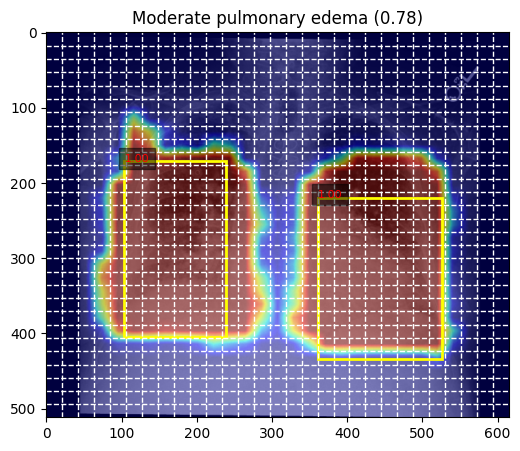

Found 3 rows for dicom_id 09d5f30e-922a26ad-712b751d-defb41d7-f206cded
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19155768/s56844524/09d5f30e-922a26ad-712b751d-defb41d7-f206cded.jpg
Label text: Moderate pulmonary edema
Category name: Edema
x: 101.02421465968587, y: 187.37106918238996, w: 142.27912303664922, h: 199.8490566037736
Label text: Moderate pulmonary edema
Category name: Edema
x: 350.56609947643983, y: 203.27044025157232, w: 163.20844240837698, h: 206.6918238993711
Label text: enlarged cardiac silhouette
Category name: Cardiomegaly
x: 233.8448952879581, y: 236.47798742138366, w: 279.3259162303665, h: 162.8176100628931


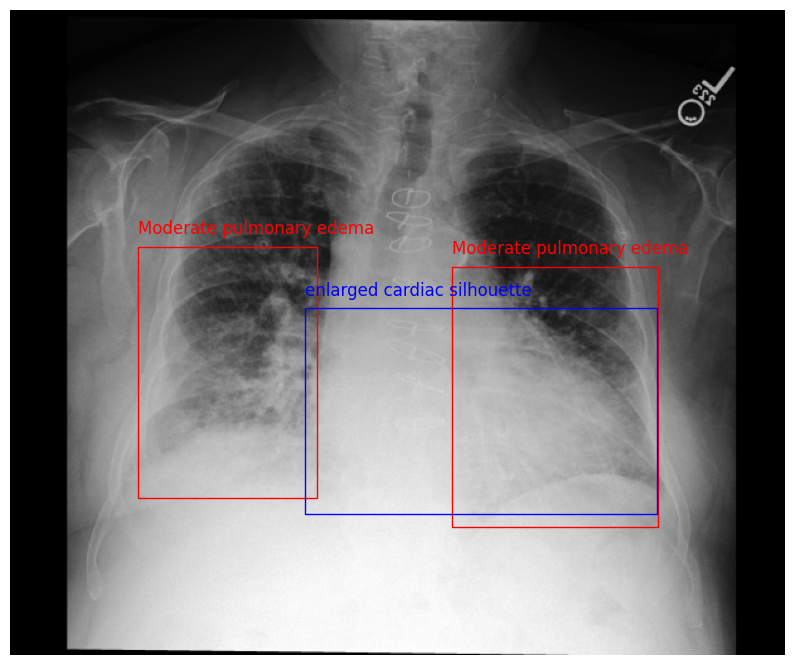

In [152]:
q = 'Moderate pulmonary edema'
index = tmp['train_preds_and_gt']['phrases'].index(q)
print(tmp['train_preds_and_gt']['ious_2'][index])
print(tmp['train_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['train_preds_and_gt'], index,
                                              iou_thr=tmp['train_best_iou_th_2'],
                                              conf_thr=tmp['train_best_conf_th_2'],
                                              pre_nms_max_det=tmp['train_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['train_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['train_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.8100598702365619
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10500792/s52823815/2e0e4c28-77275236-9695b5f1-bedff2d6-f816e6f7.jpg


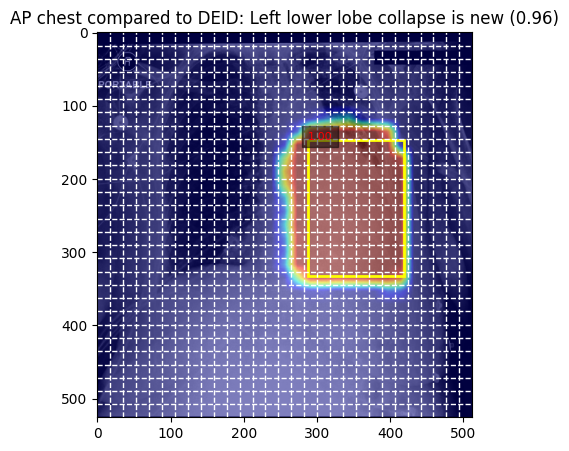

Found 1 rows for dicom_id 2e0e4c28-77275236-9695b5f1-bedff2d6-f816e6f7
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10500792/s52823815/2e0e4c28-77275236-9695b5f1-bedff2d6-f816e6f7.jpg
Label text: AP chest compared to DEID: Left lower lobe collapse is new
Category name: Atelectasis
x: 279.0894052776684, y: 147.06242818843356, w: 129.05868452146512, h: 187.75641516660284


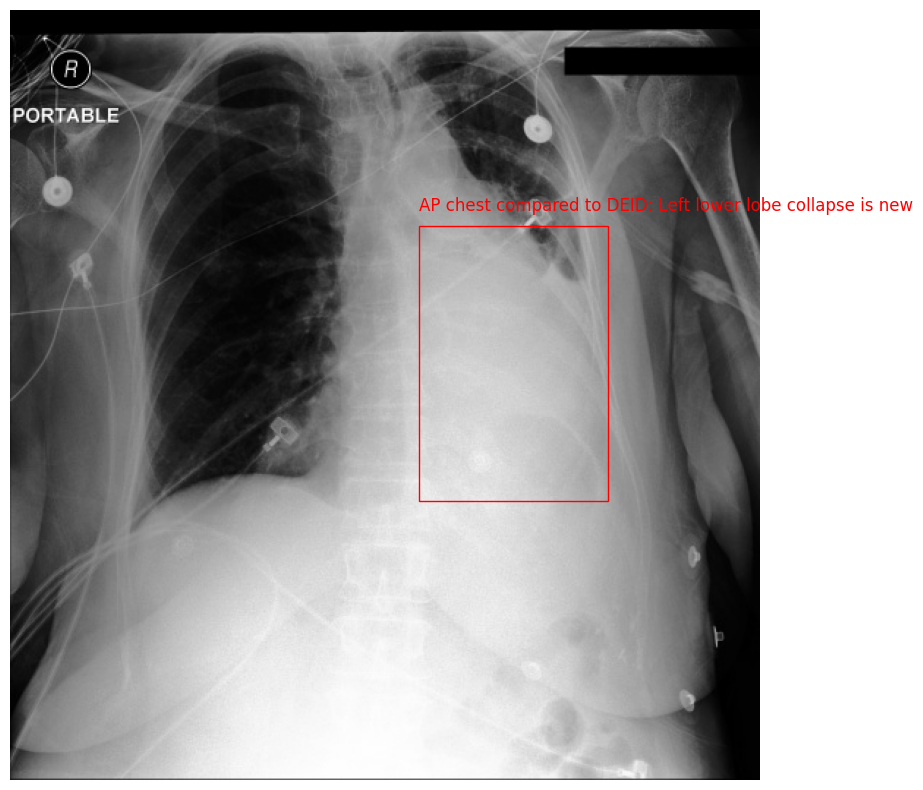

In [153]:
q = 'AP chest compared to DEID: Left lower lobe collapse is new'
index = tmp['train_preds_and_gt']['phrases'].index(q)
print(tmp['train_preds_and_gt']['ious_2'][index])
print(tmp['train_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['train_preds_and_gt'], index,
                                              iou_thr=tmp['train_best_iou_th_2'],
                                              pre_nms_max_det=tmp['train_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['train_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['train_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.9650190248771743
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15144601/s51244891/ce4d53fc-3f17c875-c053c0b1-43ce1358-096e6002.jpg


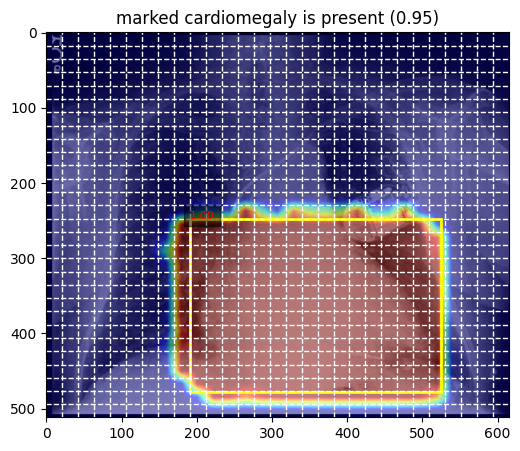

Found 1 rows for dicom_id ce4d53fc-3f17c875-c053c0b1-43ce1358-096e6002
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15144601/s51244891/ce4d53fc-3f17c875-c053c0b1-43ce1358-096e6002.jpg
Label text: marked cardiomegaly is present
Category name: Cardiomegaly
x: 196.8160994764398, y: 246.9433962264151, w: 324.2032068062827, h: 229.8364779874214


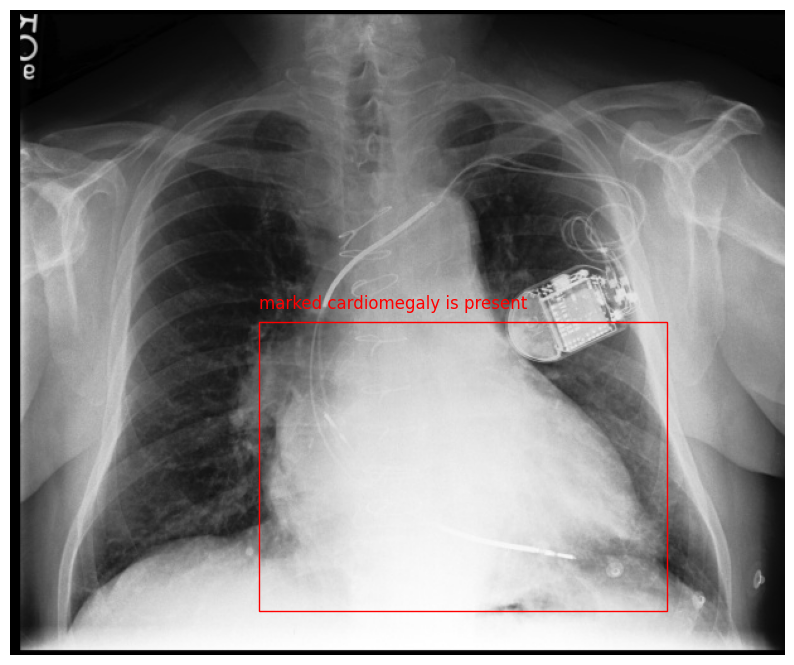

In [154]:
index = idxs[0]
print(tmp['train_preds_and_gt']['ious_2'][index])
print(tmp['train_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['train_preds_and_gt'], index,
                                              iou_thr=tmp['train_best_iou_th_2'],
                                              conf_thr=tmp['train_best_conf_th_2'],
                                              pre_nms_max_det=tmp['train_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['train_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['train_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.9624554512733106
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15419510/s52189004/1b6cfbee-901f801d-651c11f8-2c84bb31-91883814.jpg


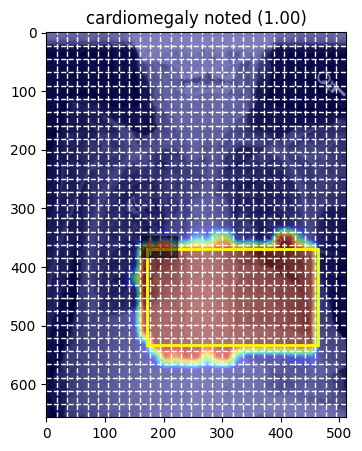

Found 1 rows for dicom_id 1b6cfbee-901f801d-651c11f8-2c84bb31-91883814
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15419510/s52189004/1b6cfbee-901f801d-651c11f8-2c84bb31-91883814.jpg
Label text: cardiomegaly noted
Category name: Cardiomegaly
x: 169.80580075662044, y: 370.6374345549738, w: 291.18789407314, h: 159.73527486910993


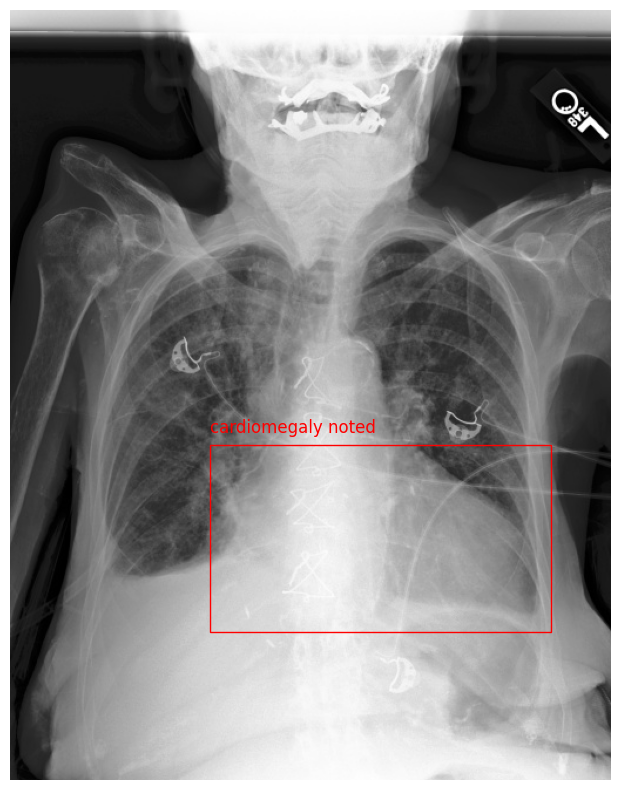

In [155]:
index = idxs[1]
print(tmp['train_preds_and_gt']['ious_2'][index])
print(tmp['train_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['train_preds_and_gt'], index,
                                              iou_thr=tmp['train_best_iou_th_2'],
                                              conf_thr=tmp['train_best_conf_th_2'],
                                              pre_nms_max_det=tmp['train_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['train_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['train_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.9609852548530226
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p12/p12963531/s58929701/db56399e-4f04b226-d9773c85-a6d565a6-04fe3904.jpg


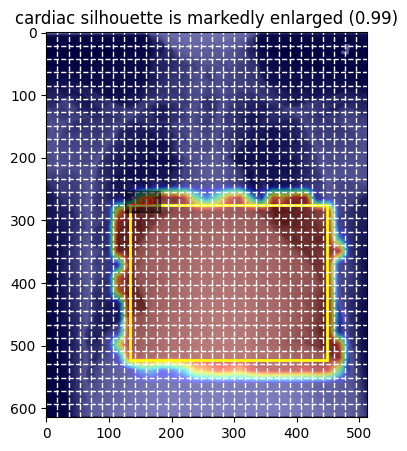

Found 1 rows for dicom_id db56399e-4f04b226-d9773c85-a6d565a6-04fe3904
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p12/p12963531/s58929701/db56399e-4f04b226-d9773c85-a6d565a6-04fe3904.jpg
Label text: cardiac silhouette is markedly enlarged
Category name: Cardiomegaly
x: 132.42767295597486, y: 276.1060209424084, w: 312.9559748427673, h: 251.9568062827225


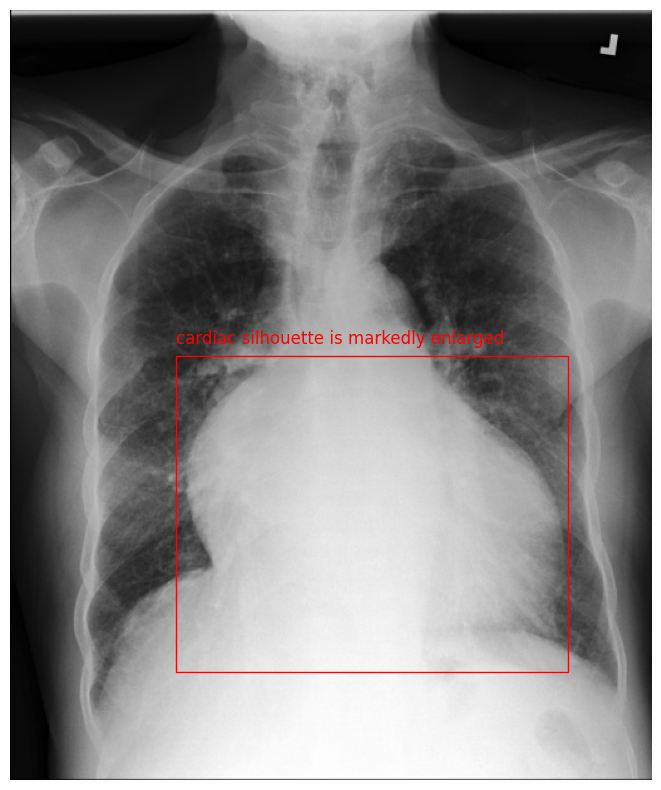

In [156]:
index = idxs[2]
print(tmp['train_preds_and_gt']['ious_2'][index])
print(tmp['train_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['train_preds_and_gt'], index,
                                              iou_thr=tmp['train_best_iou_th_2'],
                                              conf_thr=tmp['train_best_conf_th_2'],
                                              pre_nms_max_det=tmp['train_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['train_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['train_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.8709290613831934
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p14/p14939898/s58625661/d4f0d97c-72567146-ee0487ff-a3d1cc6f-78099694.jpg


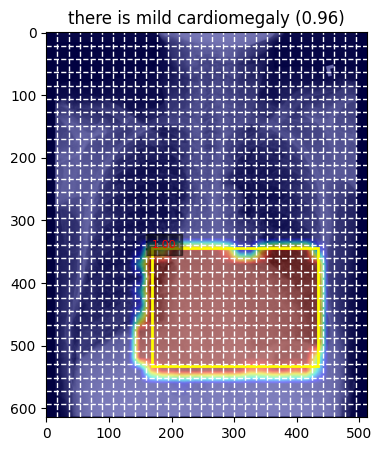

Found 1 rows for dicom_id d4f0d97c-72567146-ee0487ff-a3d1cc6f-78099694
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p14/p14939898/s58625661/d4f0d97c-72567146-ee0487ff-a3d1cc6f-78099694.jpg
Label text: there is mild cardiomegaly
Category name: Cardiomegaly
x: 169.66037735849056, y: 362.84195026178014, w: 260.8301886792453, h: 165.0196335078534


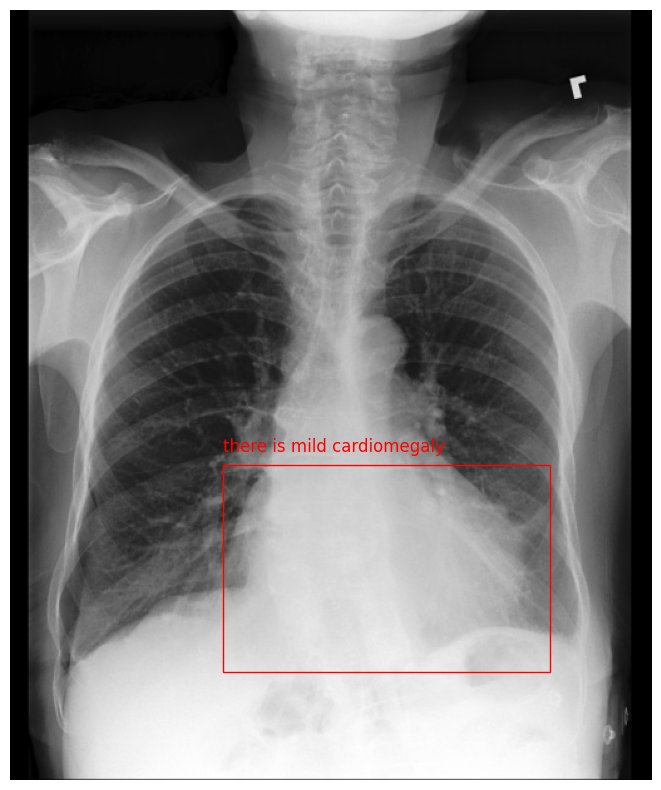

In [157]:
index = idxs[100]
print(tmp['train_preds_and_gt']['ious_2'][index])
print(tmp['train_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['train_preds_and_gt'], index,
                                              iou_thr=tmp['train_best_iou_th_2'],
                                              conf_thr=tmp['train_best_conf_th_2'],
                                              pre_nms_max_det=tmp['train_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['train_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['train_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.012089314979016748
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10176514/s56622871/2bfbb8d4-370e3dd0-fb6e2f6a-68435e4d-32033248.jpg


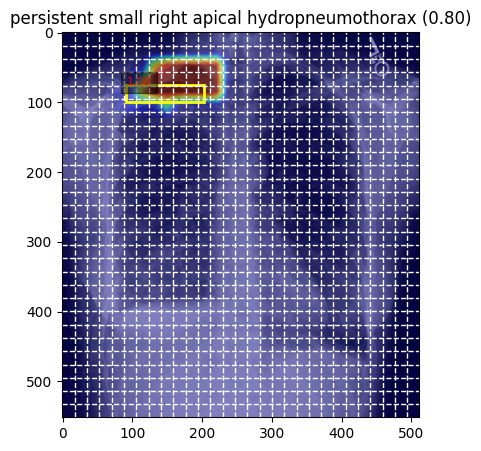

Found 1 rows for dicom_id 2bfbb8d4-370e3dd0-fb6e2f6a-68435e4d-32033248
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10176514/s56622871/2bfbb8d4-370e3dd0-fb6e2f6a-68435e4d-32033248.jpg
Label text: persistent small right apical hydropneumothorax
Category name: Pneumothorax
x: 134.99772209567197, y: 44.25316455696203, w: 92.13667425968109, h: 32.31645569620253


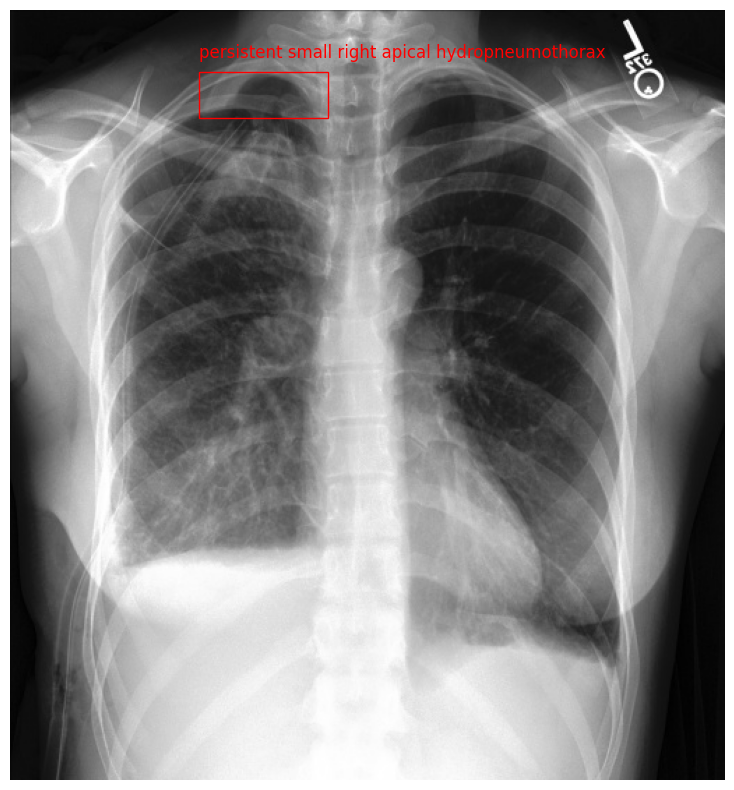

In [158]:
index = idxs[-2]
print(tmp['train_preds_and_gt']['ious_2'][index])
print(tmp['train_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['train_preds_and_gt'], index,
                                              iou_thr=tmp['train_best_iou_th_2'],
                                              conf_thr=tmp['train_best_conf_th_2'],
                                              pre_nms_max_det=tmp['train_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['train_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['train_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.07863988670615277
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p14/p14065514/s50052981/8726c74a-245ab051-430f078d-b0c78c3e-7f0d714e.jpg


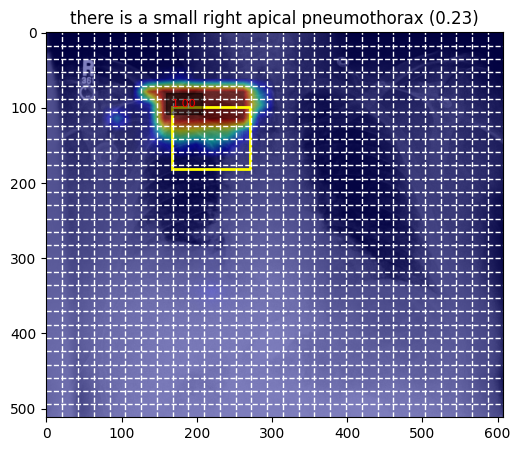

Found 1 rows for dicom_id 8726c74a-245ab051-430f078d-b0c78c3e-7f0d714e
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p14/p14065514/s50052981/8726c74a-245ab051-430f078d-b0c78c3e-7f0d714e.jpg
Label text: there is a small right apical pneumothorax
Category name: Pneumothorax
x: 156.02116402116403, y: 79.69811320754718, w: 105.95767195767195, h: 27.9748427672956


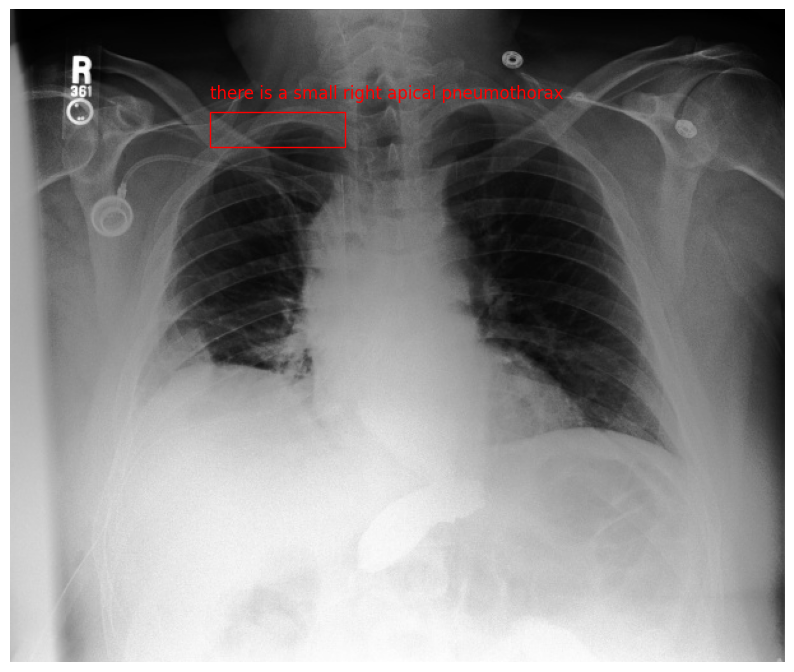

In [159]:
index = idxs[-3]
print(tmp['train_preds_and_gt']['ious_2'][index])
print(tmp['train_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['train_preds_and_gt'], index,
                                              iou_thr=tmp['train_best_iou_th_2'],
                                              conf_thr=tmp['train_best_conf_th_2'],
                                              pre_nms_max_det=tmp['train_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['train_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['train_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.4900236368488906
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13415410/s55345925/c8186025-4c5d3f4c-6b055ff6-866156db-5498778d.jpg


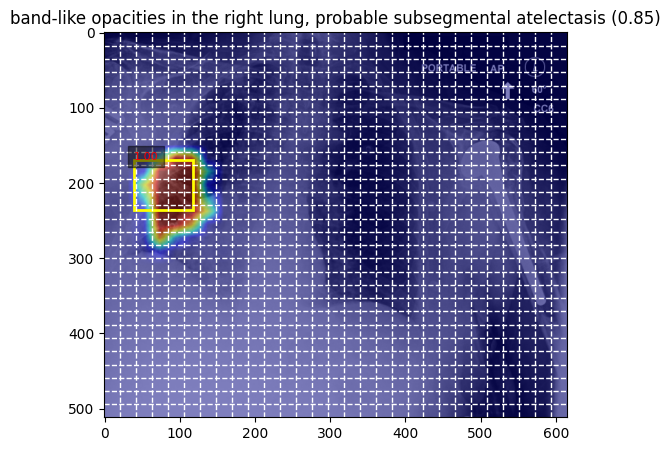

Found 1 rows for dicom_id c8186025-4c5d3f4c-6b055ff6-866156db-5498778d
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13415410/s55345925/c8186025-4c5d3f4c-6b055ff6-866156db-5498778d.jpg
Label text: band-like opacities in the right lung, probable subsegmental atelectasis
Category name: Atelectasis
x: 66.13770491803278, y: 177.45569121701456, w: 54.84590163934426, h: 71.99054745962977


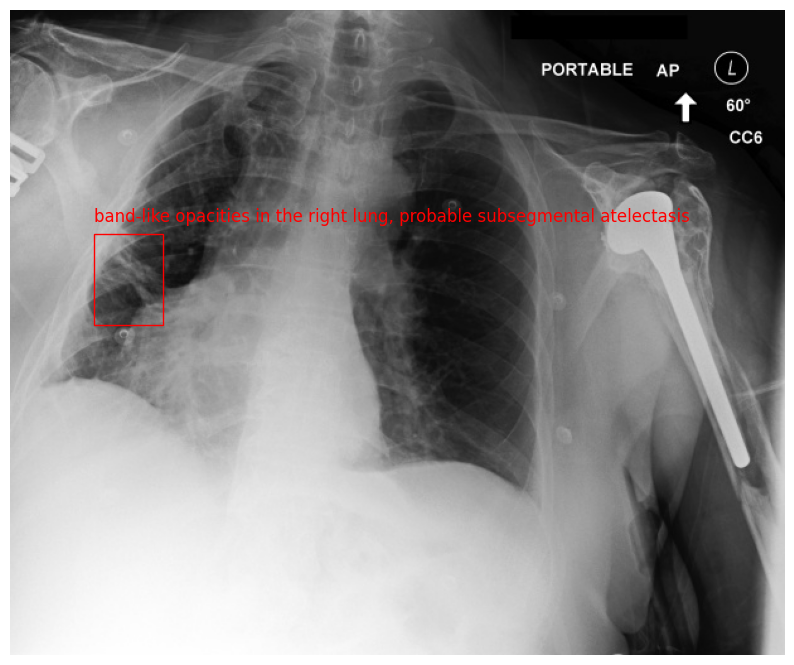

In [160]:
index = idxs[-100]
print(tmp['train_preds_and_gt']['ious_2'][index])
print(tmp['train_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['train_preds_and_gt'], index,
                                              iou_thr=tmp['train_best_iou_th_2'],
                                              conf_thr=tmp['train_best_conf_th_2'],
                                              pre_nms_max_det=tmp['train_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['train_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['train_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.49143545426792157
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10678335/s53343765/600b88e8-cdeb206f-24980db9-a88d5336-a9ab05ba.jpg


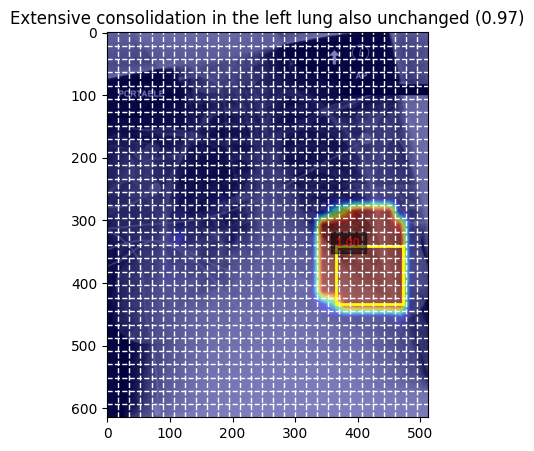

Found 1 rows for dicom_id 600b88e8-cdeb206f-24980db9-a88d5336-a9ab05ba
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10678335/s53343765/600b88e8-cdeb206f-24980db9-a88d5336-a9ab05ba.jpg
Label text: Extensive consolidation in the left lung also unchanged
Category name: Consolidation
x: 360.9610082709728, y: 301.8540983606557, w: 96.99566758566364, h: 112.91803278688523


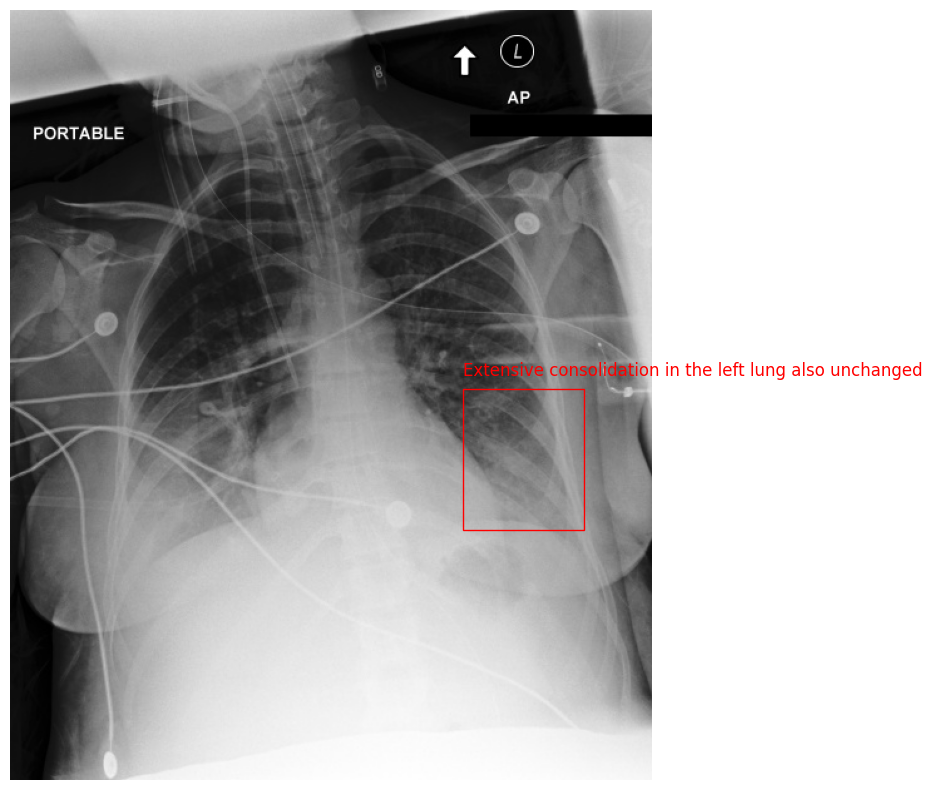

In [161]:
index = idxs[-101]
print(tmp['train_preds_and_gt']['ious_2'][index])
print(tmp['train_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['train_preds_and_gt'], index,
                                              iou_thr=tmp['train_best_iou_th_2'],
                                              conf_thr=tmp['train_best_conf_th_2'],
                                              pre_nms_max_det=tmp['train_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['train_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['train_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.6069925839939283
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10670818/s50191454/1176839d-cf4f677f-d597a1ef-548bc32a-c05429f3.jpg


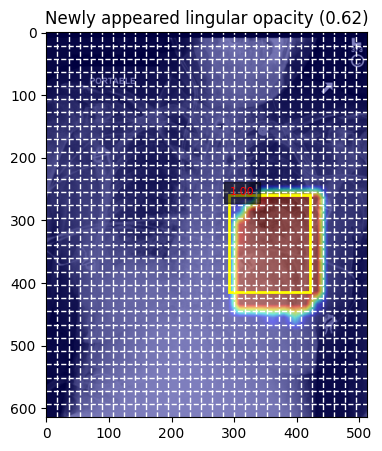

Found 1 rows for dicom_id 1176839d-cf4f677f-d597a1ef-548bc32a-c05429f3
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10670818/s50191454/1176839d-cf4f677f-d597a1ef-548bc32a-c05429f3.jpg
Label text: Newly appeared lingular opacity
Category name: Pneumonia
x: 314.1772351319417, y: 285.52131147540985, w: 113.53131153997636, h: 145.58360655737704


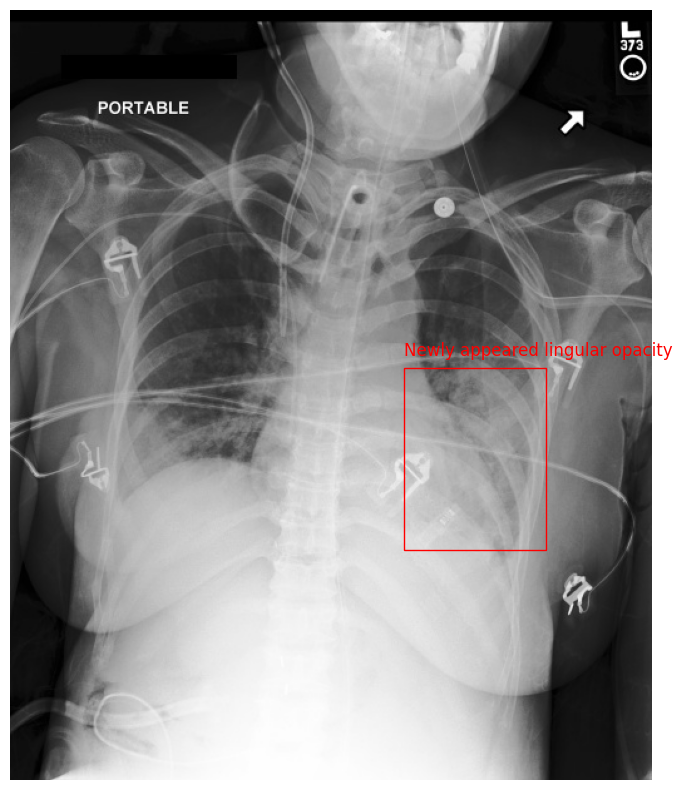

In [162]:
index = idxs[-200]
print(tmp['train_preds_and_gt']['ious_2'][index])
print(tmp['train_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['train_preds_and_gt'], index,
                                              iou_thr=tmp['train_best_iou_th_2'],
                                              conf_thr=tmp['train_best_conf_th_2'],
                                              pre_nms_max_det=tmp['train_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['train_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['train_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

In [165]:
idxs = np.argsort(tmp['test_preds_and_gt']['ious_2'])[::-1]
print(tmp['test_best_iou_th_2'])
print(tmp['test_best_conf_th_2'])
print(tmp['test_best_pre_nms_max_det_2'])
print(tmp['test_best_post_nms_max_det_2'])

0.4
0.5
50
2


0.9140009942539419
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13820366/s57798676/4a83b37a-23203e27-02d50dff-e844997a-a60ee329.jpg


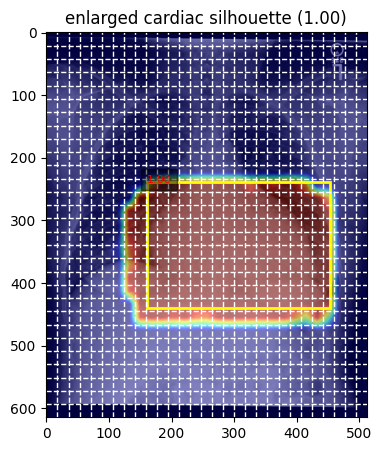

Found 1 rows for dicom_id 4a83b37a-23203e27-02d50dff-e844997a-a60ee329
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13820366/s57798676/4a83b37a-23203e27-02d50dff-e844997a-a60ee329.jpg
Label text: enlarged cardiac silhouette
Category name: Cardiomegaly
x: 153.9622641509434, y: 243.10209424083772, w: 288.8050314465409, h: 192.99247382198953


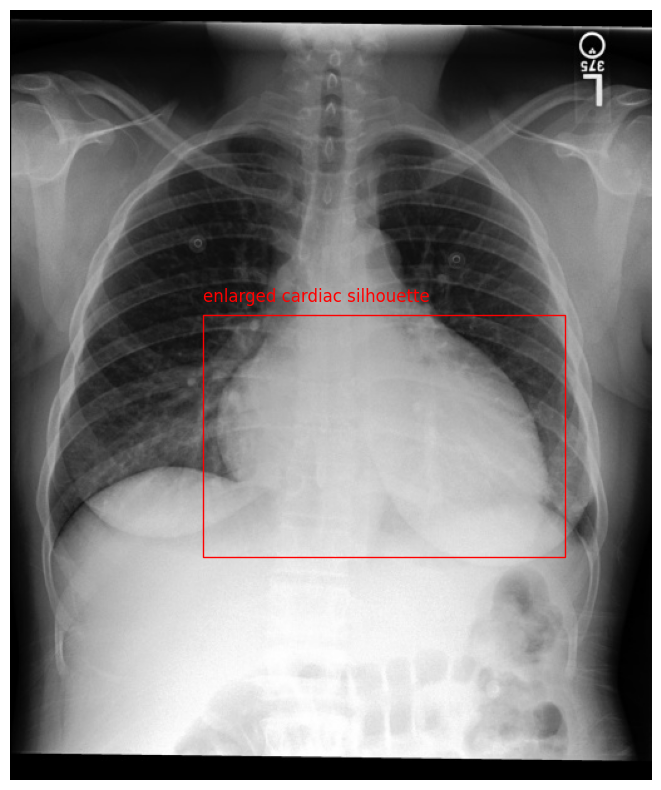

In [166]:
index = idxs[0]
print(tmp['test_preds_and_gt']['ious_2'][index])
print(tmp['test_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['test_preds_and_gt'], index,
                                              iou_thr=tmp['test_best_iou_th_2'],
                                              conf_thr=tmp['test_best_conf_th_2'],
                                              pre_nms_max_det=tmp['test_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['test_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['test_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.9105224097742138
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10891332/s53691817/ff63bc32-158e159a-561853c6-5f8809e4-2f7d857a.jpg


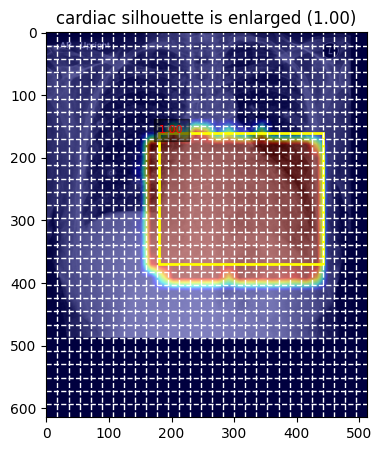

Found 1 rows for dicom_id ff63bc32-158e159a-561853c6-5f8809e4-2f7d857a
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10891332/s53691817/ff63bc32-158e159a-561853c6-5f8809e4-2f7d857a.jpg
Label text: cardiac silhouette is enlarged
Category name: Cardiomegaly
x: 171.874213836478, y: 182.93030104712042, w: 248.75471698113208, h: 211.10438481675394


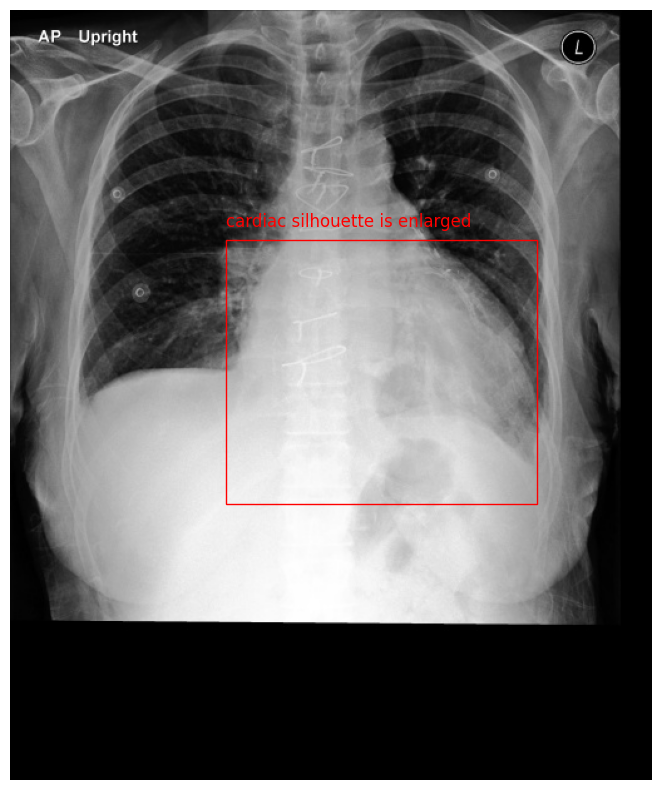

In [167]:
index = idxs[1]
print(tmp['test_preds_and_gt']['ious_2'][index])
print(tmp['test_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['test_preds_and_gt'], index,
                                              iou_thr=tmp['test_best_iou_th_2'],
                                              conf_thr=tmp['test_best_conf_th_2'],
                                              pre_nms_max_det=tmp['test_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['test_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['test_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.47873485729425536
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10640977/s52825690/288a7d41-dfc9638d-24b10d18-6dc6eafc-df0208d2.jpg


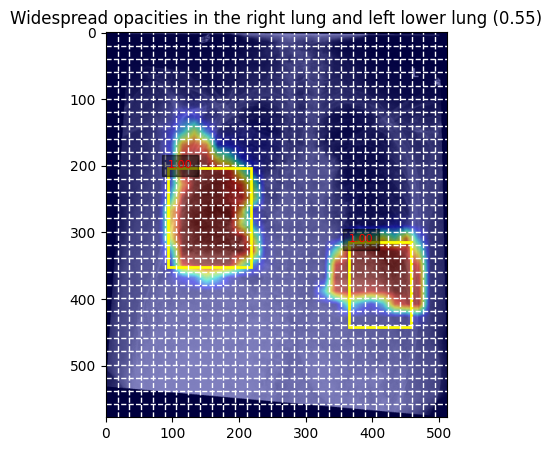

Found 2 rows for dicom_id 288a7d41-dfc9638d-24b10d18-6dc6eafc-df0208d2
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10640977/s52825690/288a7d41-dfc9638d-24b10d18-6dc6eafc-df0208d2.jpg
Label text: Widespread opacities in the right lung and left lower lung
Category name: Pneumonia
x: 98.81823860087445, y: 142.50304035378662, w: 130.79825109306682, h: 234.8424543946932
Label text: Widespread opacities in the right lung and left lower lung
Category name: Pneumonia
x: 327.155527795128, y: 254.33278054173576, w: 129.1992504684572, h: 152.08844665561082


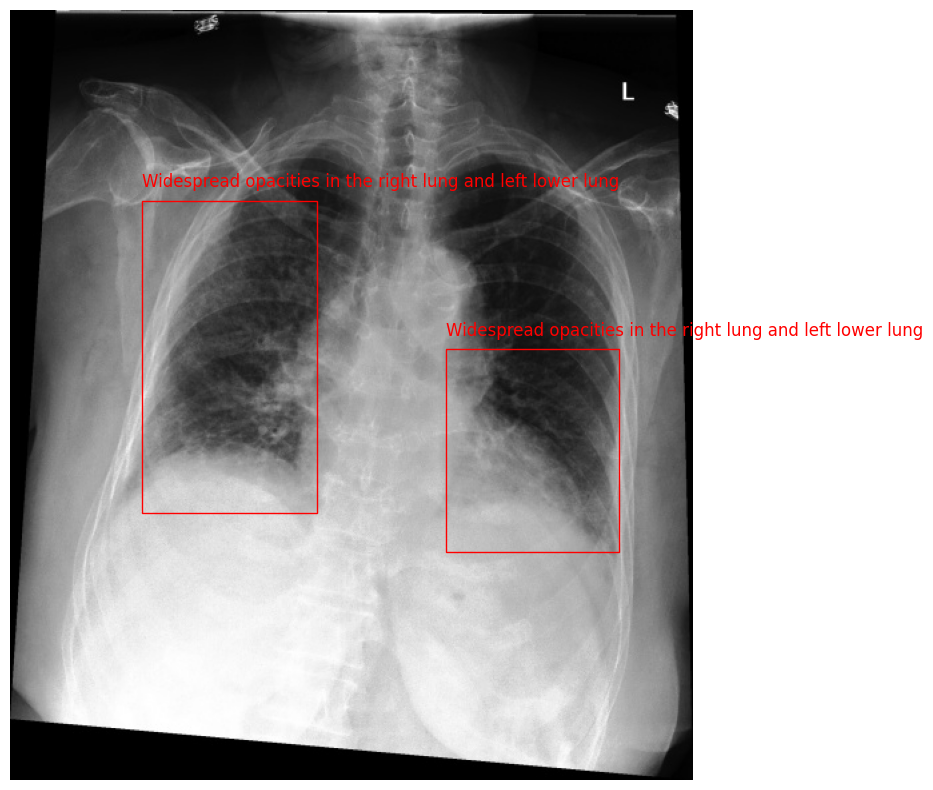

In [168]:
index = idxs[100]
print(tmp['test_preds_and_gt']['ious_2'][index])
print(tmp['test_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['test_preds_and_gt'], index,
                                              iou_thr=tmp['test_best_iou_th_2'],
                                              conf_thr=tmp['test_best_conf_th_2'],
                                              pre_nms_max_det=tmp['test_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['test_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['test_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.0
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10395166/s59367648/146df8f2-587b432d-3151e370-fcba82ce-23b7e6ff.jpg


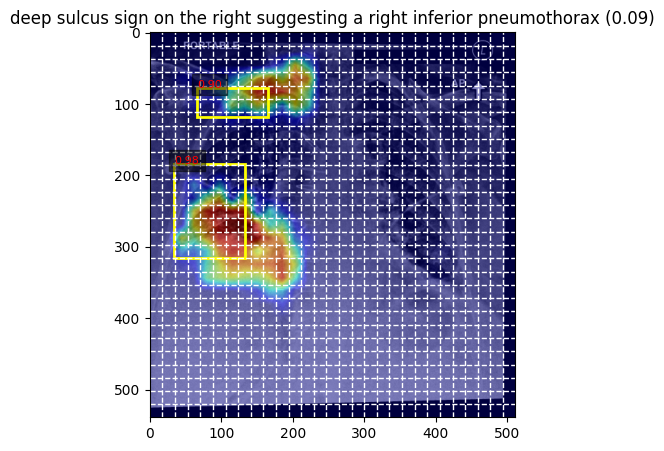

Found 1 rows for dicom_id 146df8f2-587b432d-3151e370-fcba82ce-23b7e6ff
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10395166/s59367648/146df8f2-587b432d-3151e370-fcba82ce-23b7e6ff.jpg
Label text: deep sulcus sign on the right suggesting a right inferior pneumothorax
Category name: Pneumothorax
x: 141.04802021903959, y: 289.2037554934079, w: 78.50379106992418, h: 169.04314822213345


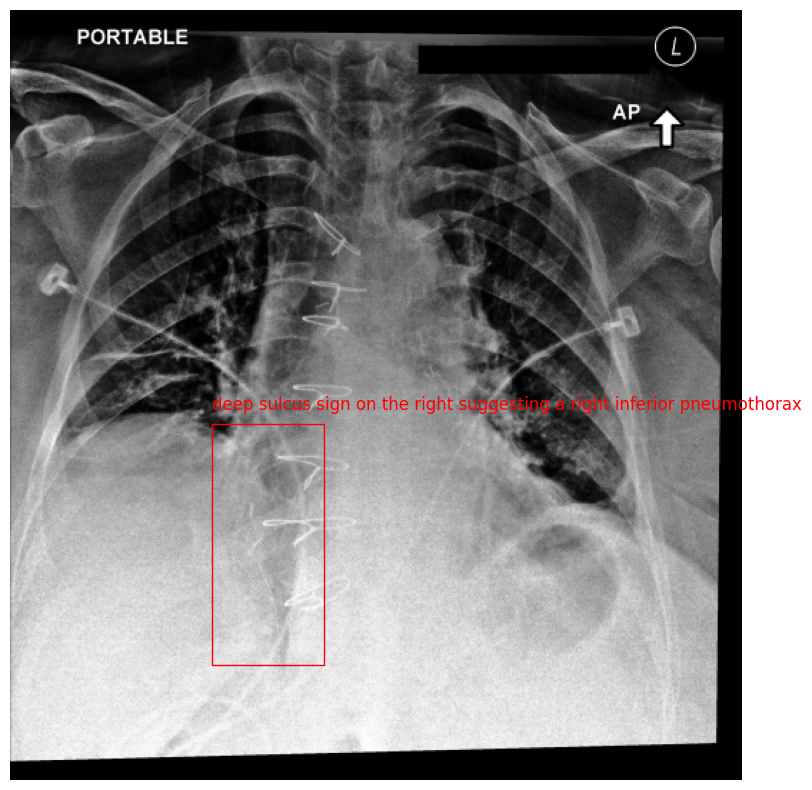

In [169]:
index = idxs[-1]
print(tmp['test_preds_and_gt']['ious_2'][index])
print(tmp['test_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['test_preds_and_gt'], index,
                                              iou_thr=tmp['test_best_iou_th_2'],
                                              conf_thr=tmp['test_best_conf_th_2'],
                                              pre_nms_max_det=tmp['test_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['test_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['test_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.027864168468719426
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10216556/s50981597/018aa67e-edbe363c-b7b7db2a-6cbf31b9-a55e9aae.jpg


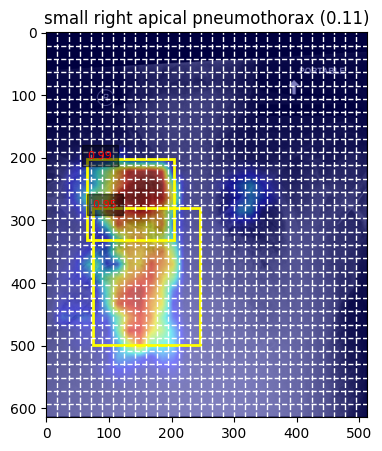

Found 1 rows for dicom_id 018aa67e-edbe363c-b7b7db2a-6cbf31b9-a55e9aae
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10216556/s50981597/018aa67e-edbe363c-b7b7db2a-6cbf31b9-a55e9aae.jpg
Label text: small right apical pneumothorax
Category name: Pneumothorax
x: 119.9496855345912, y: 224.58769633507853, w: 71.44654088050315, h: 19.118128272251308


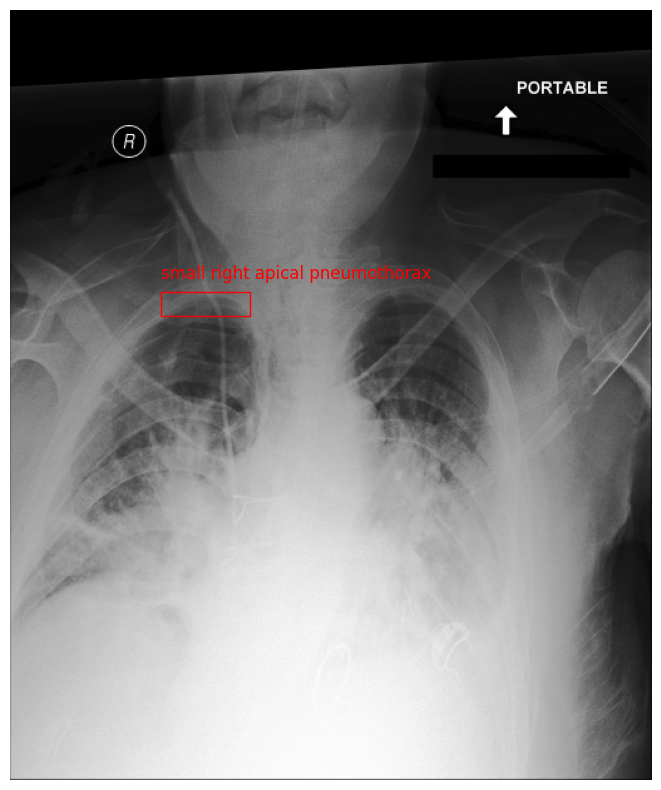

In [170]:
index = idxs[-2]
print(tmp['test_preds_and_gt']['ious_2'][index])
print(tmp['test_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['test_preds_and_gt'], index,
                                              iou_thr=tmp['test_best_iou_th_2'],
                                              conf_thr=tmp['test_best_conf_th_2'],
                                              pre_nms_max_det=tmp['test_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['test_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['test_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.10158076873103268
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p11/p11508828/s56551712/26737002-631059a7-f531f9fe-94a38d2a-b889cbb0.jpg


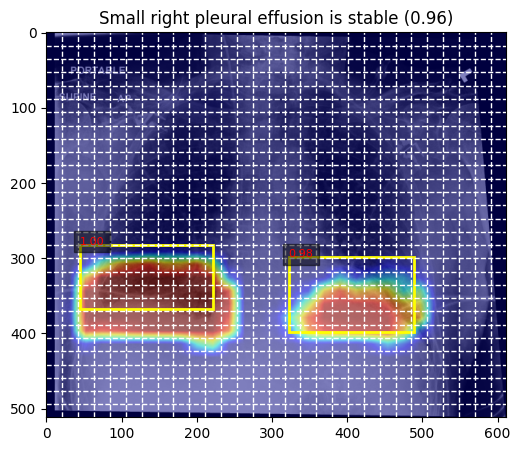

Found 1 rows for dicom_id 26737002-631059a7-f531f9fe-94a38d2a-b889cbb0
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p11/p11508828/s56551712/26737002-631059a7-f531f9fe-94a38d2a-b889cbb0.jpg
Label text: Small right pleural effusion is stable
Category name: Pleural Effusion
x: 50.81515650741351, y: 339.9889720362347, w: 151.84052718286657, h: 89.93777077589601


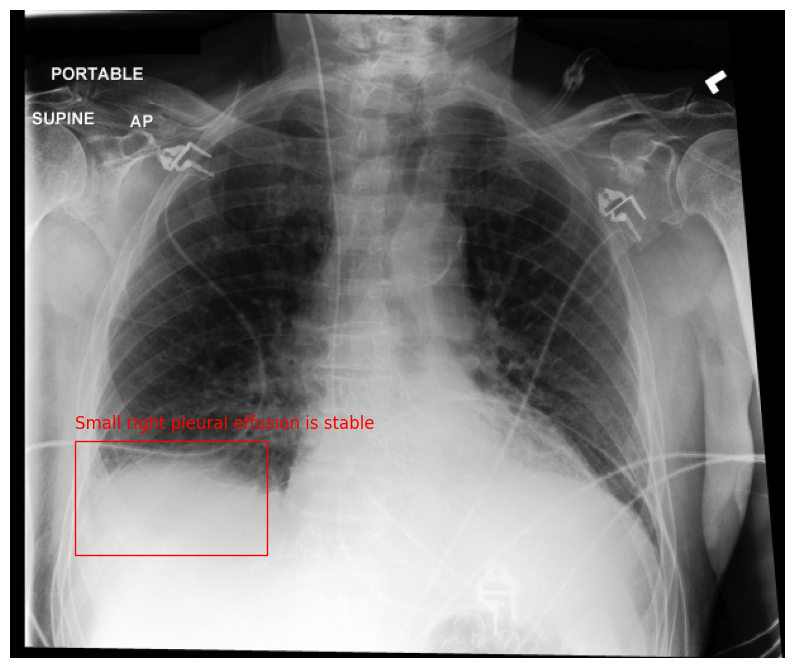

In [171]:
index = idxs[-3]
print(tmp['test_preds_and_gt']['ious_2'][index])
print(tmp['test_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['test_preds_and_gt'], index,
                                              iou_thr=tmp['test_best_iou_th_2'],
                                              conf_thr=tmp['test_best_conf_th_2'],
                                              pre_nms_max_det=tmp['test_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['test_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['test_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

0.13911975697229745
/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15131736/s58698919/4b3c3806-311dc11c-5c89f911-3f5b98e5-e5291eb6.jpg


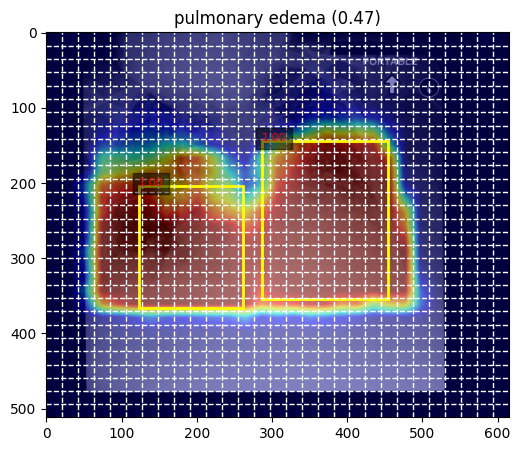

Found 2 rows for dicom_id 4b3c3806-311dc11c-5c89f911-3f5b98e5-e5291eb6
Image path: /mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15131736/s58698919/4b3c3806-311dc11c-5c89f911-3f5b98e5-e5291eb6.jpg
Label text: pulmonary edema
Category name: Edema
x: 295.8278795811518, y: 133.43396226415095, w: 120.74607329842932, h: 78.8930817610063
Label text: enlarged cardiac silhouette
Category name: Cardiomegaly
x: 147.51145287958116, y: 185.35849056603774, w: 313.3360602094241, h: 182.33962264150944


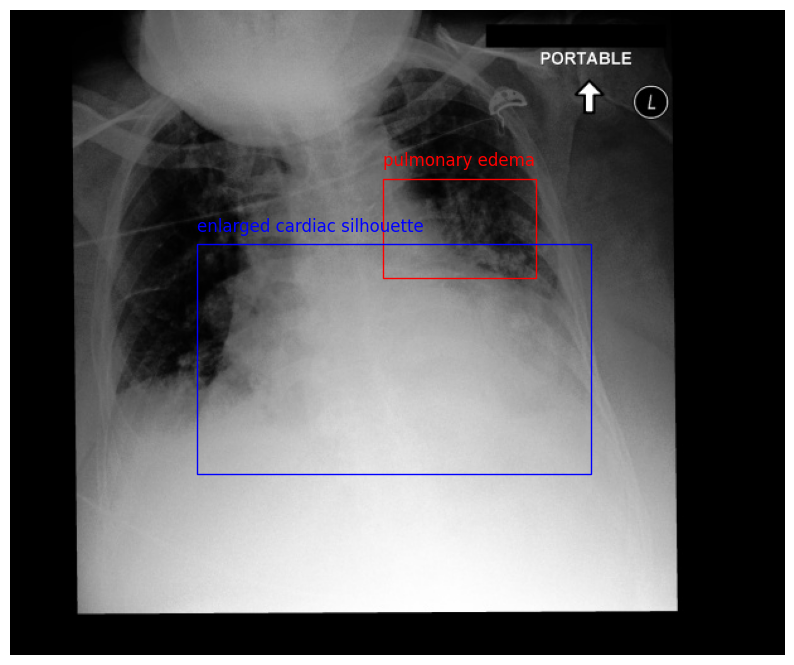

In [172]:
index = idxs[-10]
print(tmp['test_preds_and_gt']['ious_2'][index])
print(tmp['test_preds_and_gt']['image_paths'][index])
vis_data = adapt_prediction_for_visualization(tmp['test_preds_and_gt'], index,
                                              iou_thr=tmp['test_best_iou_th_2'],
                                              conf_thr=tmp['test_best_conf_th_2'],
                                              pre_nms_max_det=tmp['test_best_pre_nms_max_det_2'],
                                              post_nms_max_det=tmp['test_best_post_nms_max_det_2'],
                                              bbox_format='cxcywh')
visualize_visual_grounding_as_bboxes(**vis_data)

dicom_id = os.path.basename(tmp['test_preds_and_gt']['image_paths'][index]).split('.')[0]
pgav.visualize_dicom_id(dicom_id)

In [58]:
from medvqa.utils.files import load_pickle
from medvqa.utils.common import print_nested_dict

In [59]:
tmp1 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20250323_172425_mim-facts+mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/mscxr_metrics.pkl')

In [60]:
tmp2 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20250323_115427_mscxr+vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/mscxr_metrics.pkl')

In [61]:
tmp3 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20250323_092924_mscxr_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/mscxr_metrics.pkl')

In [62]:
tmp4 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20250217_111607_vinbig_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/mscxr_metrics.pkl')

In [63]:
tmp5 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20250401_191427_mscxr_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/mscxr_metrics.pkl')

In [64]:
tmp6 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20250406_081849_mscxr_PhraseGrounder(aehrc-cxrmate-rrg24-uniformer,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/mscxr_metrics.pkl')

In [65]:
tmp7 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20250409_084600_mscxr_PhraseGrounder(microsoft-rad-dino-maira-2,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/mscxr_metrics.pkl')

In [66]:
tmp8 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20250409_060154_mscxr_PhraseGrounder(facebook-convnext-small-224,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/mscxr_metrics.pkl')

In [86]:
tmp9 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20250409_225245_mscxr_PhraseGrounder(facebook-convnext-small-224,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/mscxr_metrics.pkl')

In [87]:
tmp10 = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/results/phrase_grounding/20250409_224838_mscxr_PhraseGrounder(microsoft-rad-dino-maira-2,AdaptiveFiLM_MLP_BBoxRegression,128,256,256-128)/mscxr_metrics.pkl')

In [67]:
tmp1.keys()

dict_keys(['train_preds_and_gt', 'val_preds_and_gt', 'test_preds_and_gt', 'train_iou_with_boostrapping', 'val_iou_with_boostrapping', 'test_iou_with_boostrapping', 'train_iou_with_boostrapping_2', 'val_iou_with_boostrapping_2', 'test_iou_with_boostrapping_2', 'train_avg_classification_prob_with_bootstrappig', 'val_avg_classification_prob_with_bootstrappig', 'test_avg_classification_prob_with_bootstrappig', 'train_best_conf_th', 'val_best_conf_th', 'test_best_conf_th', 'train_best_iou_th_2', 'val_best_iou_th_2', 'test_best_iou_th_2', 'train_best_conf_th_2', 'val_best_conf_th_2', 'test_best_conf_th_2', 'train_best_max_det_2', 'val_best_max_det_2', 'test_best_max_det_2'])

In [93]:
import numpy as np
import matplotlib.pyplot as plt
from medvqa.evaluation.plots import plot_metric_bars_per_method

tmp_files = [tmp1, tmp2, tmp3, tmp4, tmp5, tmp6, tmp7, tmp8, tmp9, tmp10]

# method_aliases = [
#     'FGVLM(UniFormer); tr: MS-CXR + MIMIC-CXR(facts, GPT-4 labels) + VinDr-CXR (modif)',
#     'FGVLM(UniFormer); tr: MS-CXR + VinDr-CXR (modif)',
#     'FGVLM(UniFormer); tr: MS-CXR',
#     'FGVLM(UniFormer); tr: MIMIC-CXR(facts, GPT-4 labels) + VinDr-CXR (modif)',
#     'FGVLM*(UniFormer); tr: MS-CXR (full dataset, cheating), pretrained on M+V',
#     'FGVLM*(UniFormer); tr: MS-CXR, pretrained on M+V',
#     'FGVLM*(RAD-DINO-MAIRA-2); tr: MS-CXR (full dataset, cheating), pretrained on M+V',
#     'FGVLM*(ConvNeXt-small); tr: MS-CXR (full dataset, cheating), pretrained on M+V',
#     'FGVLM*(ConvNeXt-small); tr: MS-CXR, pretrained on M+V',
#     'FGVLM*(RAD-DINO-MAIRA-2); tr: MS-CXR, pretrained on M+V',
# ]

method_aliases = [
    'FGVLM(UniFormer); tr: MS-CXR + MIMIC-CXR(facts, GPT-4 labels) + VinDr-CXR (modif)',
    'FGVLM(UniFormer); tr: MS-CXR + VinDr-CXR (modif)',
    'FGVLM(UniFormer); tr: MS-CXR',
    'FGVLM(UniFormer); tr: MIMIC-CXR(facts, GPT-4 labels) + VinDr-CXR (modif)',
    # Use r'' for raw string and \mathbf with explicit spaces '\ '
    r'FGVLM*(UniFormer); tr: MS-CXR $\mathbf{(full\ dataset,\ cheating)}$, pretrained on M+V',
    'FGVLM*(UniFormer); tr: MS-CXR, pretrained on M+V',
    # Use r'' for raw string and \mathbf with explicit spaces '\ '
    r'FGVLM*(RAD-DINO-MAIRA-2); tr: MS-CXR $\mathbf{(full\ dataset,\ cheating)}$, pretrained on M+V',
    # Use r'' for raw string and \mathbf with explicit spaces '\ '
    r'FGVLM*(ConvNeXt-small); tr: MS-CXR $\mathbf{(full\ dataset,\ cheating)}$, pretrained on M+V',
    'FGVLM*(ConvNeXt-small); tr: MS-CXR, pretrained on M+V',
    'FGVLM*(RAD-DINO-MAIRA-2); tr: MS-CXR, pretrained on M+V',
]

def get_dict(x):
    out = dict()
    for k, v in x.items():
        out[k] = v['mean']
        out[k + '_std'] = v['std']
    return out

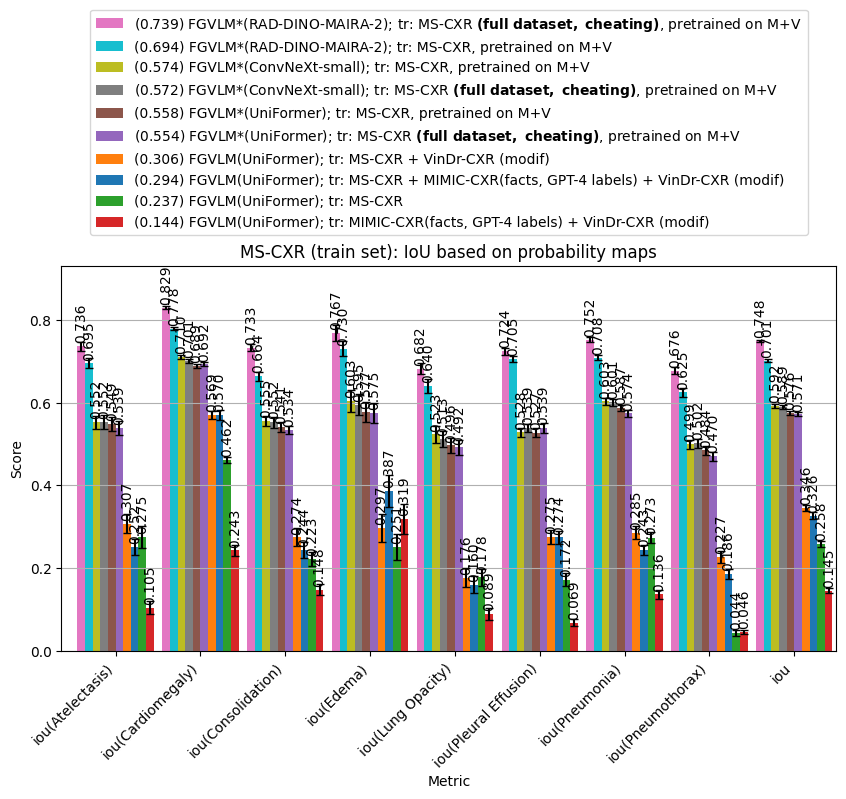

In [123]:
metric_names = list(tmp_files[0]['train_iou_with_boostrapping'].keys())
metric_aliases = metric_names
method_dicts = [get_dict(tmp['train_iou_with_boostrapping']) for tmp in tmp_files ]
assert len(method_dicts) == len(method_aliases)

# Plot the results using the function
plot_metric_bars_per_method(
    method_dicts=method_dicts,
    method_aliases=method_aliases,
    metric_names=metric_names,
    metric_aliases=metric_aliases,
    title='MS-CXR (train set): IoU based on probability maps',
    vertical=True,
    sort_metrics=False,
    show_std=True,
    figsize=(10, 5),
    bbox_to_anchor=(0.5, 1.08),
    xtick_rotation=45,
    xlim=[0.085, 1.1],
    ylim=[0, 0.93],
    scores_fontsize=10,
)

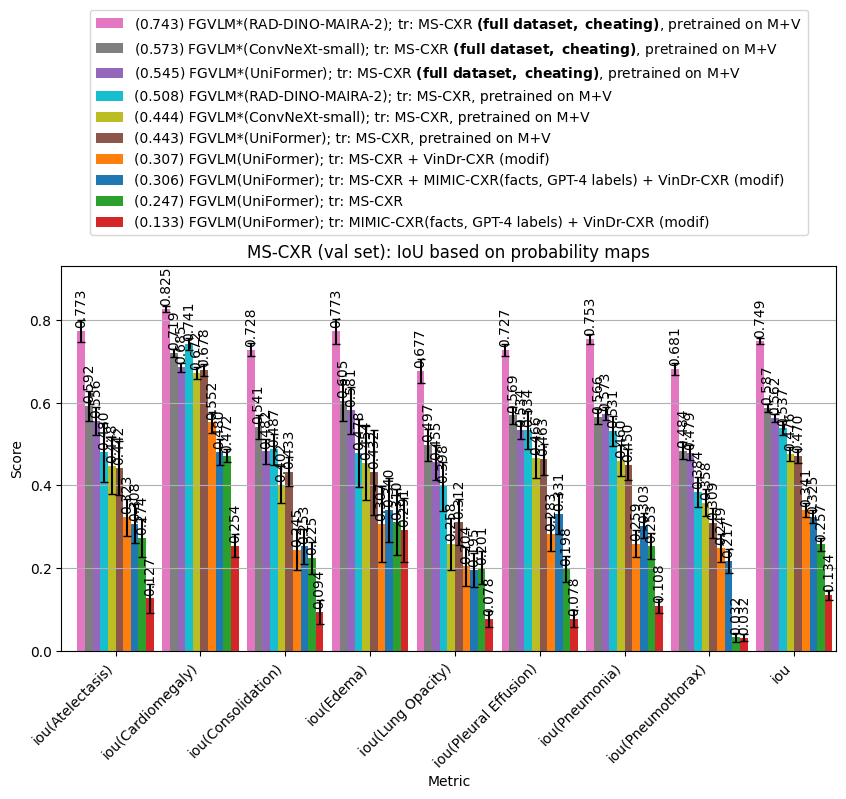

In [124]:
metric_names = list(tmp_files[0]['val_iou_with_boostrapping'].keys())
metric_aliases = metric_names
method_dicts = [get_dict(tmp['val_iou_with_boostrapping']) for tmp in tmp_files ]
assert len(method_dicts) == len(method_aliases)

# Plot the results using the function
plot_metric_bars_per_method(
    method_dicts=method_dicts,
    method_aliases=method_aliases,
    metric_names=metric_names,
    metric_aliases=metric_aliases,
    title='MS-CXR (val set): IoU based on probability maps',
    vertical=True,
    sort_metrics=False,
    show_std=True,
    figsize=(10, 5),
    bbox_to_anchor=(0.5, 1.08),
    xtick_rotation=45,
    xlim=[0.085, 1.1],
    ylim=[0, 0.93],
    scores_fontsize=10,
)

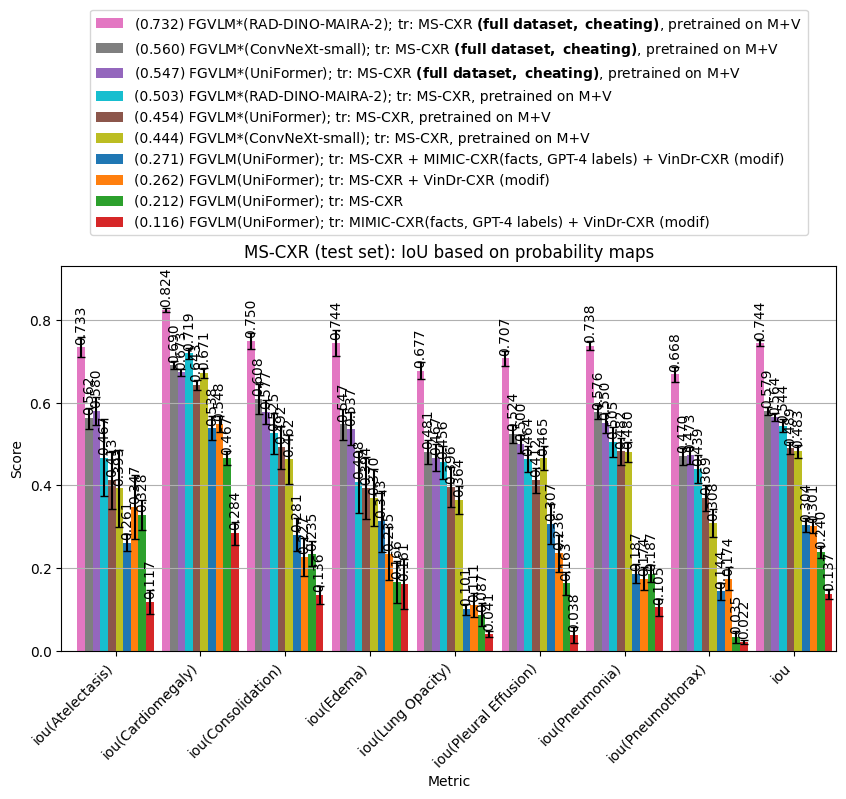

In [125]:
metric_names = list(tmp_files[0]['test_iou_with_boostrapping'].keys())
metric_aliases = metric_names
method_dicts = [get_dict(tmp['test_iou_with_boostrapping']) for tmp in tmp_files ]
assert len(method_dicts) == len(method_aliases)

# Plot the results using the function
plot_metric_bars_per_method(
    method_dicts=method_dicts,
    method_aliases=method_aliases,
    metric_names=metric_names,
    metric_aliases=metric_aliases,
    title='MS-CXR (test set): IoU based on probability maps',
    vertical=True,
    sort_metrics=False,
    show_std=True,
    figsize=(10, 5),
    bbox_to_anchor=(0.5, 1.08),
    xtick_rotation=45,
    xlim=[0.085, 1.1],
    ylim=[0, 0.93],
    scores_fontsize=10,
)

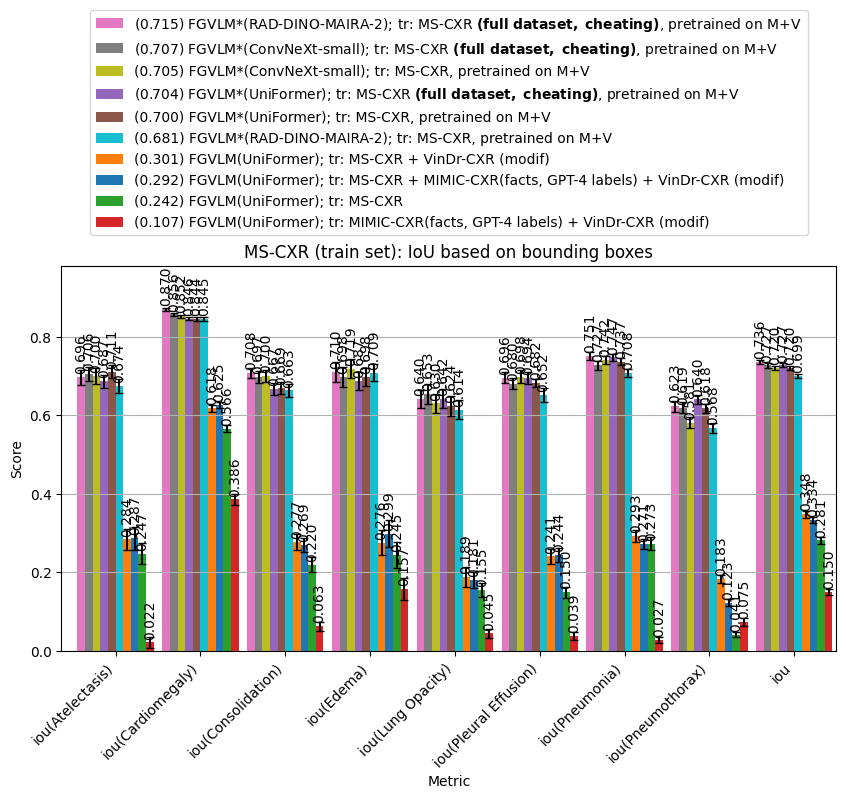

In [126]:
metric_names = list(tmp_files[0]['train_iou_with_boostrapping_2'].keys())
metric_aliases = metric_names
method_dicts = [get_dict(tmp['train_iou_with_boostrapping_2']) for tmp in tmp_files ]
assert len(method_dicts) == len(method_aliases)

# Plot the results using the function
plot_metric_bars_per_method(
    method_dicts=method_dicts,
    method_aliases=method_aliases,
    metric_names=metric_names,
    metric_aliases=metric_aliases,
    title='MS-CXR (train set): IoU based on bounding boxes',
    vertical=True,
    sort_metrics=False,
    show_std=True,
    figsize=(10, 5),
    bbox_to_anchor=(0.5, 1.08),
    xtick_rotation=45,
    xlim=[0.085, 1.1],
    ylim=[0, 0.98],
    scores_fontsize=10,
)

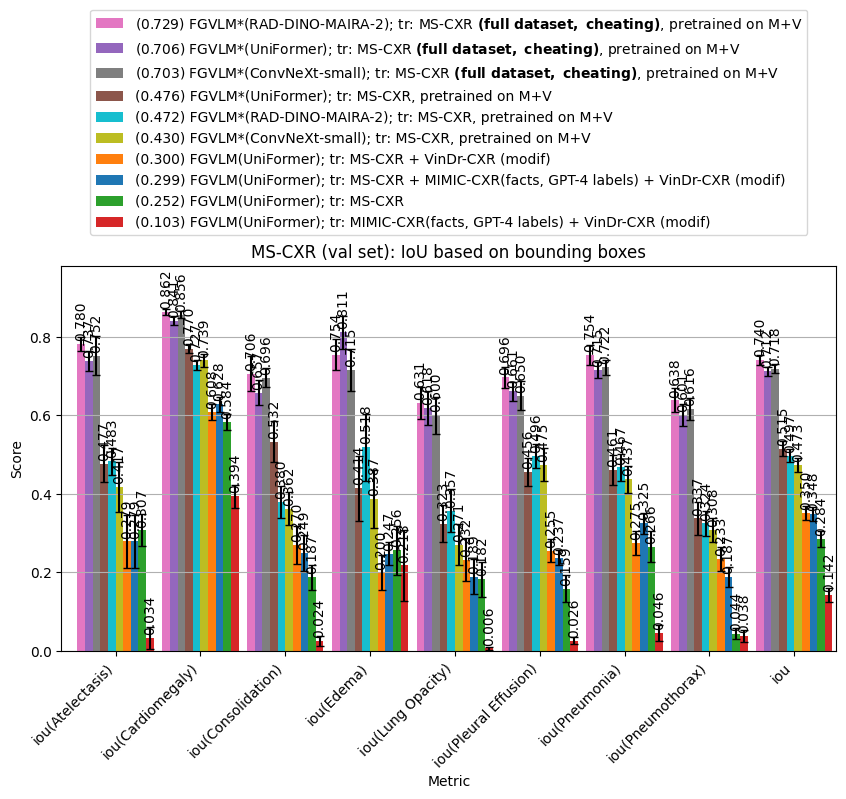

In [127]:
metric_names = list(tmp_files[0]['val_iou_with_boostrapping_2'].keys())
metric_aliases = metric_names
method_dicts = [get_dict(tmp['val_iou_with_boostrapping_2']) for tmp in tmp_files ]
assert len(method_dicts) == len(method_aliases)

# Plot the results using the function
plot_metric_bars_per_method(
    method_dicts=method_dicts,
    method_aliases=method_aliases,
    metric_names=metric_names,
    metric_aliases=metric_aliases,
    title='MS-CXR (val set): IoU based on bounding boxes',
    vertical=True,
    sort_metrics=False,
    show_std=True,
    figsize=(10, 5),
    bbox_to_anchor=(0.5, 1.08),
    xtick_rotation=45,
    xlim=[0.085, 1.1],
    ylim=[0, 0.98],
    scores_fontsize=10,
)

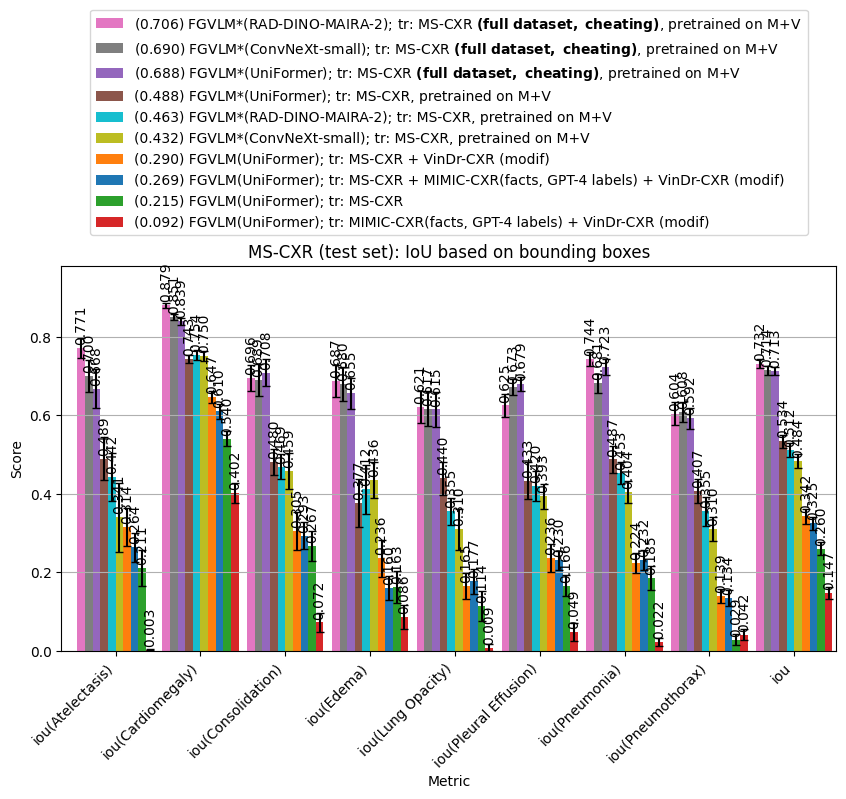

In [128]:
metric_names = list(tmp_files[0]['test_iou_with_boostrapping_2'].keys())
metric_aliases = metric_names
method_dicts = [get_dict(tmp['test_iou_with_boostrapping_2']) for tmp in tmp_files ]
assert len(method_dicts) == len(method_aliases)

# Plot the results using the function
plot_metric_bars_per_method(
    method_dicts=method_dicts,
    method_aliases=method_aliases,
    metric_names=metric_names,
    metric_aliases=metric_aliases,
    title='MS-CXR (test set): IoU based on bounding boxes',
    vertical=True,
    sort_metrics=False,
    show_std=True,
    figsize=(10, 5),
    bbox_to_anchor=(0.5, 1.08),
    xtick_rotation=45,
    xlim=[0.085, 1.1],
    ylim=[0, 0.98],
    scores_fontsize=10,
)

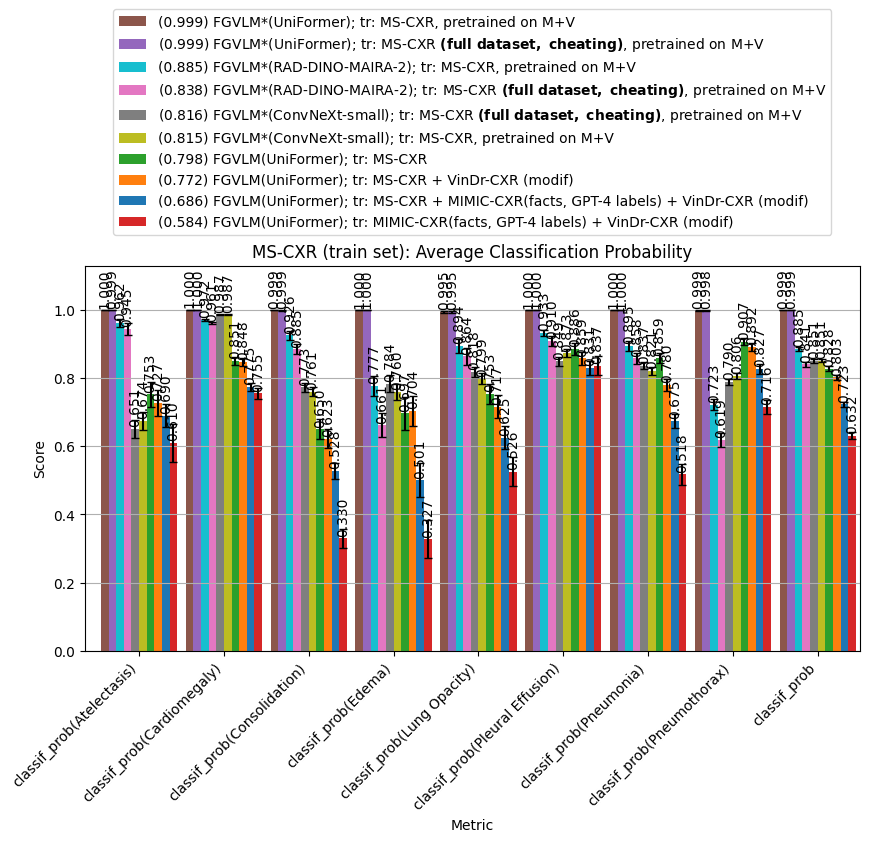

In [129]:
metric_names = list(tmp_files[0]['train_avg_classification_prob_with_bootstrappig'].keys())
metric_aliases = [x.replace('avg_classification_prob', 'classif_prob') for x in metric_names]
method_dicts = [get_dict(tmp['train_avg_classification_prob_with_bootstrappig']) for tmp in tmp_files]
assert len(method_dicts) == len(method_aliases)

# Plot the results using the function
plot_metric_bars_per_method(
    method_dicts=method_dicts,
    method_aliases=method_aliases,
    metric_names=metric_names,
    metric_aliases=metric_aliases,
    title='MS-CXR (train set): Average Classification Probability',
    vertical=True,
    sort_metrics=False,
    show_std=True,
    figsize=(10, 5),
    bbox_to_anchor=(0.5, 1.08),
    xtick_rotation=45,
    xlim=[0.085, 1.1],
    ylim=[0, 1.13],
    scores_fontsize=10,
)

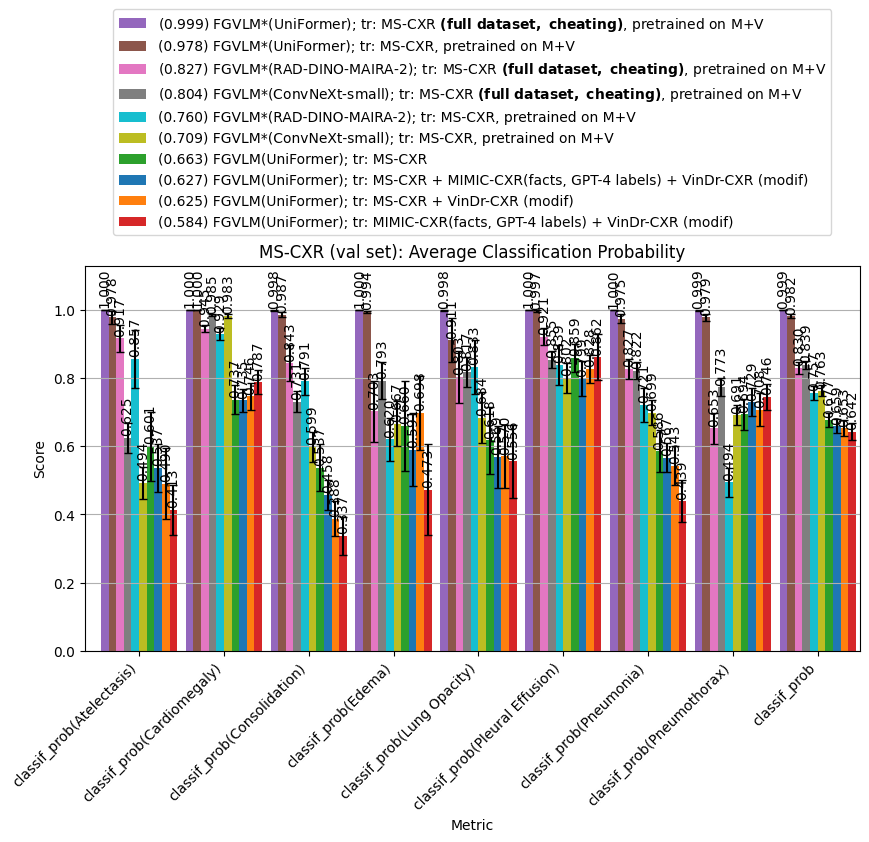

In [130]:
metric_names = list(tmp_files[0]['val_avg_classification_prob_with_bootstrappig'].keys())
metric_aliases = [x.replace('avg_classification_prob', 'classif_prob') for x in metric_names]
method_dicts = [get_dict(tmp['val_avg_classification_prob_with_bootstrappig']) for tmp in tmp_files]
assert len(method_dicts) == len(method_aliases)

# Plot the results using the function
plot_metric_bars_per_method(
    method_dicts=method_dicts,
    method_aliases=method_aliases,
    metric_names=metric_names,
    metric_aliases=metric_aliases,
    title='MS-CXR (val set): Average Classification Probability',
    vertical=True,
    sort_metrics=False,
    show_std=True,
    figsize=(10, 5),
    bbox_to_anchor=(0.5, 1.08),
    xtick_rotation=45,
    xlim=[0.085, 1.1],
    ylim=[0, 1.13],
    scores_fontsize=10,
)

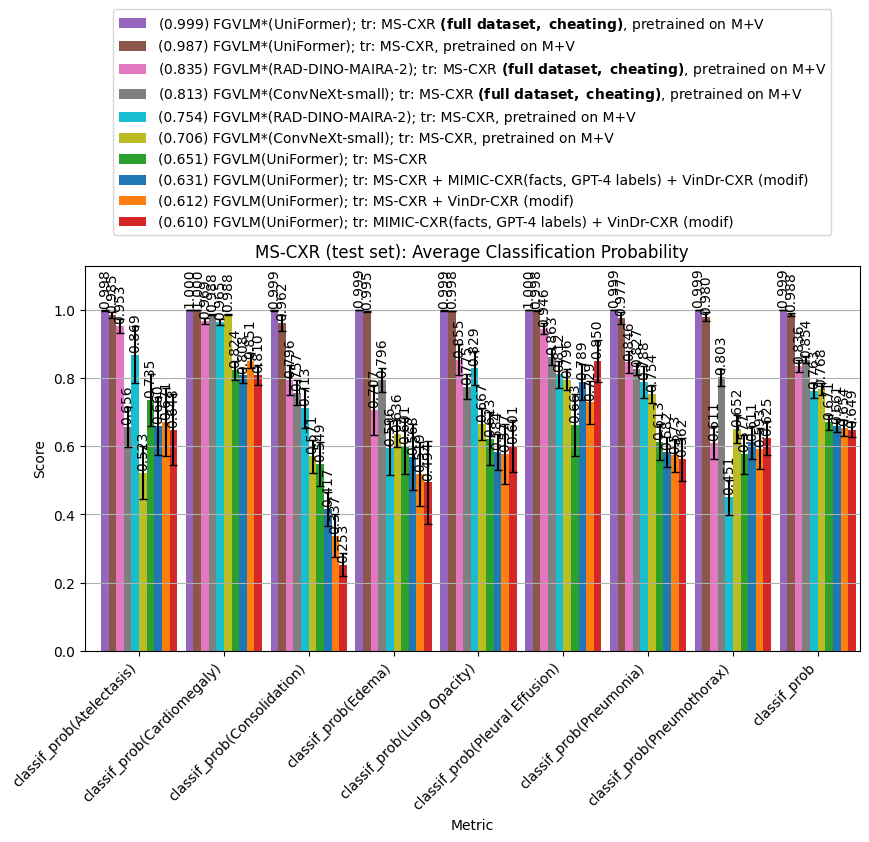

In [131]:
metric_names = list(tmp_files[0]['test_avg_classification_prob_with_bootstrappig'].keys())
metric_aliases = [x.replace('avg_classification_prob', 'classif_prob') for x in metric_names]
method_dicts = [get_dict(tmp['test_avg_classification_prob_with_bootstrappig']) for tmp in tmp_files]
assert len(method_dicts) == len(method_aliases)

# Plot the results using the function
plot_metric_bars_per_method(
    method_dicts=method_dicts,
    method_aliases=method_aliases,
    metric_names=metric_names,
    metric_aliases=metric_aliases,
    title='MS-CXR (test set): Average Classification Probability',
    vertical=True,
    sort_metrics=False,
    show_std=True,
    figsize=(10, 5),
    bbox_to_anchor=(0.5, 1.08),
    xtick_rotation=45,
    xlim=[0.085, 1.1],
    ylim=[0, 1.13],
    scores_fontsize=10,
)

In [11]:
reload(medvqa.evaluation.plots)

<module 'medvqa.evaluation.plots' from '/home/pamessina/medvqa/medvqa/evaluation/plots.py'>

In [12]:
from medvqa.datasets.mimiccxr import get_train_val_test_stats_per_chexpert_label
from medvqa.datasets.vinbig import compute_label_frequencies
from medvqa.evaluation.plots import plot_barchart

NOTE: Improving VinDr-CXR classification labels ...


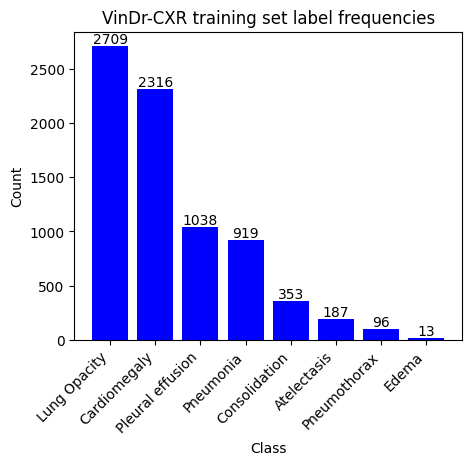

In [13]:
class_names = [
    'Atelectasis',
    'Cardiomegaly',
    'Consolidation',
    'Edema',
    'Lung Opacity',
    'Pleural effusion',
    'Pneumonia',
    'Pneumothorax',
]
freqs = compute_label_frequencies(improve_labels=True)
values = [freqs['train'][x] for x in class_names]
plot_barchart(
    values=values,
    show_values_on_bars=True,
    values_decimal_points=0,
    bar_labels=class_names,
    title='VinDr-CXR training set label frequencies',
    x_label='Class',
    y_label='Count',
    sort_values=True,
    figsize=(5, 4),
    tick_rotation=45,
)

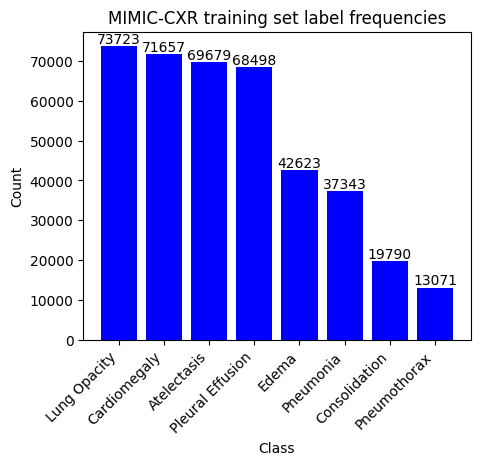

In [14]:
class_names = [
    'Atelectasis',
    'Cardiomegaly',
    'Consolidation',
    'Edema',
    'Lung Opacity',
    'Pleural Effusion',
    'Pneumonia',
    'Pneumothorax',
]
freqs = get_train_val_test_stats_per_chexpert_label('chexpert_labels_per_report__20220904_113605.pkl')
values = [freqs[x]['train']['positive'] for x in class_names]
plot_barchart(
    values=values,
    show_values_on_bars=True,
    values_decimal_points=0,
    bar_labels=class_names,
    title='MIMIC-CXR training set label frequencies',
    x_label='Class',
    y_label='Count',
    sort_values=True,
    figsize=(5, 4),    
    tick_rotation=45,
)

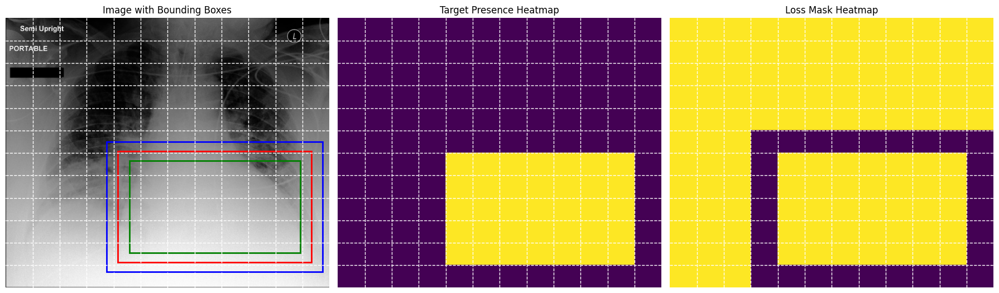

In [140]:
import math
import torch
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

def cxcywh_to_xyxy(bbox):
    """
    Convert a bounding box from (center_x, center_y, width, height) format 
    to (x_min, y_min, x_max, y_max) format.

    Args:
        bbox: Tuple or list of 4 numbers (cx, cy, w, h).

    Returns:
        A tuple (x_min, y_min, x_max, y_max).
    """
    cx, cy, w, h = bbox
    x_min = cx - w / 2.0
    y_min = cy - h / 2.0
    x_max = cx + w / 2.0
    y_max = cy + h / 2.0
    return x_min, y_min, x_max, y_max

def scale_bbox(bbox, scale):
    """
    Scales a bounding box (in xyxy format) about its center. A mild limitation is 
    enforced, so that the extension or contraction does not exceed 7% of the original 
    dimensions. This is helpful in cases where ground truth boxes might be noisy.

    Args:
        bbox: Tuple or list of 4 numbers (x_min, y_min, x_max, y_max) in normalized
              coordinates [0,1].
        scale: Scaling factor. For scale > 1, the bbox grows; for scale < 1, the 
               bbox shrinks.

    Returns:
        The scaled bbox as a tuple (new_x_min, new_y_min, new_x_max, new_y_max).
    """
    x_min, y_min, x_max, y_max = bbox
    cx = (x_min + x_max) / 2.0
    cy = (y_min + y_max) / 2.0
    w = x_max - x_min
    h = y_max - y_min

    # Limit the expansion or contraction to a maximum of 7% of the original width/height.
    if scale > 1:
        dw = min(w * (scale - 1), 0.07)
        dh = min(h * (scale - 1), 0.07)
    else:
        dw = max(w * (scale - 1), -0.07)
        dh = max(h * (scale - 1), -0.07)

    w += dw
    h += dh

    new_x_min = cx - w / 2.0
    new_y_min = cy - h / 2.0
    new_x_max = cx + w / 2.0
    new_y_max = cy + h / 2.0
    return new_x_min, new_y_min, new_x_max, new_y_max

def bbox_coords_to_grid_cell_indices(x_min, y_min, x_max, y_max, w, h):
    """
    Converts normalized bounding box coordinates to discrete grid cell indices 
    given a feature map of size (h, w).

    Args:
        x_min, y_min, x_max, y_max: Normalized bbox coordinates in the range [0,1].
        w: Width (number of columns) of the feature map.
        h: Height (number of rows) of the feature map.
        
    Returns:
        A tuple of indices (x_min_idx, y_min_idx, x_max_idx, y_max_idx) representing 
        the grid cell boundaries that overlap with the bounding box.
    """
    # Scale normalized coordinates by the number of cells (w, h)
    x_min_idx = math.floor(x_min * w)
    y_min_idx = math.floor(y_min * h)
    x_max_idx = math.ceil(x_max * w)
    y_max_idx = math.ceil(y_max * h)
    
    # Clamp indices within valid range [0, w] or [0, h]
    x_min_idx = max(0, min(w, x_min_idx))
    x_max_idx = max(0, min(w, x_max_idx))
    y_min_idx = max(0, min(h, y_min_idx))
    y_max_idx = max(0, min(h, y_max_idx))
    
    return (x_min_idx, y_min_idx, x_max_idx, y_max_idx)

def convert_bboxes_into_target_tensors(
    bboxes,
    classes,
    num_classes,
    feature_map_size,
    bbox_format="xyxy",
    apply_ignore_band=False,
    small_factor=0.9,
    large_factor=1.1,
):
    """
    Creates target tensors for bounding box regression and classification on a feature map.

    This function maps provided bounding boxes (assumed normalized in [0,1]) into a
    feature map grid. For each cell in the grid that overlaps a bounding box:
      - target_coords: Contains the bounding box coordinates.
      - target_presence: Binary tensor indicating cells with supervision (1)
                         and background (0).
      - loss_mask: If an ignore band is applied, cells within the uncertain region 
                   are marked with 0 so that the loss function can ignore them, while 
                   cells in the supervised region have a value of 1.

    Args:
        bboxes: List or tensor of shape (N, 4) containing bounding box coordinates.
                Coordinates must be normalized to [0,1].
        classes: List or tensor of shape (N,) with integer class labels for each box.
        num_classes: Total number of classes.
        feature_map_size: Tuple (H, W) defining the height and width of the feature map.
        bbox_format: String specifying the format: either "xyxy" 
                     (i.e., (x_min, y_min, x_max, y_max)) or "cxcywh" 
                     (i.e., (x_center, y_center, w, h)).
        apply_ignore_band: Boolean. When True, defines a band between a scaled-down 
                           (B_s) and a scaled-up bounding box (B_l). The cells in B_s 
                           get standard supervision (target_presence = 1), while cells 
                           in the ring between B_l and B_s are ignored in the loss (loss_mask = 0).
        small_factor: Scale factor used to compute the smaller (inner) bbox B_s.
        large_factor: Scale factor used to compute the larger (outer) bbox B_l.
                      
    Returns:
        target_coords: Tensor of shape (num_classes, H*W, 4) with copied bbox coordinates.
        target_presence: Tensor of shape (num_classes, H*W) containing binary supervision labels.
        loss_mask: Tensor of shape (num_classes, H*W) where 1 indicates cells to compute loss 
                   and 0 indicates cells to ignore.
    """
    H, W = feature_map_size  # feature map dimensions (height, width)
    N = len(bboxes)
    assert len(classes) == N

    # Initialize tensors. The bounding box coordinates are stored per cell.
    target_coords = torch.zeros(num_classes, H, W, 4)
    target_presence = torch.zeros(num_classes, H, W)
    loss_mask = torch.ones(num_classes, H, W)  # By default, all grid cells contribute to loss.

    if not apply_ignore_band:
        # Standard supervision: assign bbox info directly to all grid cells overlapping the bbox.
        for i in range(N):
            bbox = bboxes[i]
            cls = classes[i]
            # Convert bbox if necessary.
            if bbox_format == "cxcywh":
                x_min, y_min, x_max, y_max = cxcywh_to_xyxy(bbox)
            elif bbox_format == "xyxy":
                x_min, y_min, x_max, y_max = bbox
            else:
                raise ValueError("Unsupported bbox_format: use 'xyxy' or 'cxcywh'.")

            # Map normalized bbox coordinates to grid cell indices.
            x_min_idx, y_min_idx, x_max_idx, y_max_idx = bbox_coords_to_grid_cell_indices(
                x_min, y_min, x_max, y_max, W, H
            )
            # Fill target tensors for the active region.
            target_coords[cls, y_min_idx:y_max_idx, x_min_idx:x_max_idx, :] = torch.tensor(bbox)
            target_presence[cls, y_min_idx:y_max_idx, x_min_idx:x_max_idx] = 1

    else:
        # When apply_ignore_band is True, consider two regions:
        #   B_s: the inner, reliable region (using small_factor).
        #   B_l: the outer region defining uncertainty (using large_factor).
        # Cells in B_s get standard supervision, while cells in B_l but not in B_s
        # are marked to be ignored during loss computation.
        loss_mask_updates = []  # Will store indices to update loss_mask back to 1 for B_s.

        for i in range(N):
            bbox = bboxes[i]
            cls = classes[i]

            # Convert bbox if provided in cxcywh format.
            if bbox_format == "cxcywh":
                x_min, y_min, x_max, y_max = cxcywh_to_xyxy(bbox)
            elif bbox_format == "xyxy":
                x_min, y_min, x_max, y_max = bbox
            else:
                raise ValueError("Unsupported bbox_format: use 'xyxy' or 'cxcywh'.")

            # Compute the scaled bounding boxes.
            bbox_s = scale_bbox((x_min, y_min, x_max, y_max), small_factor)
            bbox_l = scale_bbox((x_min, y_min, x_max, y_max), large_factor)

            # Convert scaled bboxes to grid cell indices.
            x_min_s, y_min_s, x_max_s, y_max_s = bbox_coords_to_grid_cell_indices(
                *bbox_s, W, H
            )
            x_min_l, y_min_l, x_max_l, y_max_l = bbox_coords_to_grid_cell_indices(
                *bbox_l, W, H
            )

            # Mark all cells in the larger bbox (B_l) as "ignore" by setting loss_mask to 0.
            loss_mask[cls, y_min_l:y_max_l, x_min_l:x_max_l] = 0

            # For the inner region (B_s), update standard supervision.
            loss_mask_updates.append((cls, y_min_s, y_max_s, x_min_s, x_max_s))
            target_coords[cls, y_min_s:y_max_s, x_min_s:x_max_s, :] = torch.tensor(bbox)
            target_presence[cls, y_min_s:y_max_s, x_min_s:x_max_s] = 1

        # Restore loss_mask to 1 within the supervised (inner) region B_s.
        for cls, y_min_s, y_max_s, x_min_s, x_max_s in loss_mask_updates:
            loss_mask[cls, y_min_s:y_max_s, x_min_s:x_max_s] = 1

    # Reshape the tensors to have shape (num_classes, H*W, ...) for downstream use.
    target_coords = target_coords.view(num_classes, H * W, 4)
    target_presence = target_presence.view(num_classes, H * W)
    loss_mask = loss_mask.view(num_classes, H * W)

    return target_coords, target_presence, loss_mask

    
def visualize_bbox_output(image_path, bboxes, small_factor, large_factor, feature_map_size):
    """
    Visualizes:
      - The original image with the bounding boxes overlaid:
          • Original bbox(es) in red,
          • Scaled-down bbox(es) B_s in green, and 
          • Scaled-up bbox(es) B_l in blue.
      - Heatmaps of the target presence and loss mask over the feature map,
        with an overlaid grid showing the feat_H x feat_W cells.
      
    The bounding box coordinates passed in are assumed to be in pixel coordinates.
    They are converted into normalized coordinates for processing.
    
    Arguments:
        image_path: Path to the image.
        bboxes: A list of bounding boxes, each in the format
                [x_min, y_min, x_max, y_max] in pixel coordinates. You can also pass
                a single bounding box (as a list of 4 numbers).
        small_factor: Factor to compute the smaller bounding box.
        large_factor: Factor to compute the larger bounding box.
        feature_map_size: Tuple (feat_H, feat_W) for the feature map resolution.
    """
    import math
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from PIL import Image

    # Load image.
    img = Image.open(image_path).convert("RGB")
    img_np = np.array(img)
    H_img, W_img, _ = img_np.shape

    # Ensure we have a list of bounding boxes.
    if isinstance(bboxes[0], (int, float)):
        original_bboxes = [bboxes]
    else:
        original_bboxes = bboxes

    # Convert input (pixel) bounding boxes to normalized coordinates.
    normalized_bboxes = []
    for box in original_bboxes:
        x_min, y_min, x_max, y_max = box
        normalized_box = [
            x_min / W_img,
            y_min / H_img,
            x_max / W_img,
            y_max / H_img,
        ]
        normalized_bboxes.append(normalized_box)

    # For our minimalist example, assign all boxes to class 0.
    classes = [0] * len(normalized_bboxes)
    num_classes = 1

    # Obtain targets from the helper function using normalized bounding boxes.
    target_coords, target_presence, loss_mask = convert_bboxes_into_target_tensors(
        normalized_bboxes,
        classes,
        num_classes,
        feature_map_size,
        bbox_format="xyxy",
        apply_ignore_band=True,
        small_factor=small_factor,
        large_factor=large_factor,
    )

    # The target_presence and loss_mask tensors are of shape 
    # (num_classes, feat_H*feat_W). Reshape them to (feat_H, feat_W) for visualization.
    feat_H, feat_W = feature_map_size
    target_presence = target_presence.view(num_classes, feat_H, feat_W)[0].cpu().numpy()
    loss_mask = loss_mask.view(num_classes, feat_H, feat_W)[0].cpu().numpy()

    # Upsample the heatmaps to image resolution for visualization using nearest-neighbor.
    up_presence = (
        np.array(
            Image.fromarray((target_presence * 255).astype(np.uint8)).resize(
                (W_img, H_img), resample=Image.NEAREST
            )
        )
        / 255.0
    )
    up_loss_mask = (
        np.array(
            Image.fromarray((loss_mask * 255).astype(np.uint8)).resize(
                (W_img, H_img), resample=Image.NEAREST
            )
        )
        / 255.0
    )

    # Compute grid lines positions based on the image size and feature map size.
    cell_width = W_img / feat_W
    cell_height = H_img / feat_H
    # Grid lines (excluding image borders):
    vlines = [cell_width * i for i in range(1, feat_W)]
    hlines = [cell_height * i for i in range(1, feat_H)]

    # Start visualization.
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot 1: Original image with bounding boxes.
    axes[0].imshow(img_np)
    axes[0].set_title("Image with Bounding Boxes")
    for norm_box, orig_box in zip(normalized_bboxes, original_bboxes):
        # Draw the original box in red.
        x_min, y_min, x_max, y_max = orig_box
        rect = plt.Rectangle(
            (x_min, y_min),
            x_max - x_min,
            y_max - y_min,
            edgecolor="red",
            facecolor="none",
            linewidth=2,
        )
        axes[0].add_patch(rect)
        # Compute scaled boxes in normalized coordinates.
        norm_box_s = scale_bbox(norm_box, small_factor)
        norm_box_l = scale_bbox(norm_box, large_factor)
        # Convert scaled boxes back to pixel coordinates.
        def to_pixel_coords(norm_b):
            return (
                norm_b[0] * W_img,
                norm_b[1] * H_img,
                norm_b[2] * W_img,
                norm_b[3] * H_img,
            )
        small_box_px = to_pixel_coords(norm_box_s)
        large_box_px = to_pixel_coords(norm_box_l)
        # Draw small box (B_s) in green.
        rect_s = plt.Rectangle(
            (small_box_px[0], small_box_px[1]),
            small_box_px[2] - small_box_px[0],
            small_box_px[3] - small_box_px[1],
            edgecolor="green",
            facecolor="none",
            linewidth=2,
        )
        axes[0].add_patch(rect_s)
        # Draw large box (B_l) in blue.
        rect_l = plt.Rectangle(
            (large_box_px[0], large_box_px[1]),
            large_box_px[2] - large_box_px[0],
            large_box_px[3] - large_box_px[1],
            edgecolor="blue",
            facecolor="none",
            linewidth=2,
        )
        axes[0].add_patch(rect_l)
    for x in vlines:
        axes[0].axvline(x, color="white", linestyle="--", linewidth=1)
    for y in hlines:
        axes[0].axhline(y, color="white", linestyle="--", linewidth=1)

    # Plot 2: Upsampled target presence heatmap with grid.
    axes[1].imshow(up_presence, cmap="viridis")
    axes[1].set_title("Target Presence Heatmap")
    for x in vlines:
        axes[1].axvline(x, color="white", linestyle="--", linewidth=1)
    for y in hlines:
        axes[1].axhline(y, color="white", linestyle="--", linewidth=1)

    # Plot 3: Upsampled loss mask heatmap with grid.
    axes[2].imshow(up_loss_mask, cmap="viridis")
    axes[2].set_title("Loss Mask Heatmap")
    for x in vlines:
        axes[2].axvline(x, color="white", linestyle="--", linewidth=1)
    for y in hlines:
        axes[2].axhline(y, color="white", linestyle="--", linewidth=1)

    for ax in axes:
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# image_path = '/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10395166/s58677395/5faeaad3-f5a85682-089e4f9c-2804eaff-1495c607.jpg'
# bboxes = [
#     [314.5660377358491, 122.55726439790577, 49.509433962264154, 17.910667539267017]
# ]

# image_path = '/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10866763/s55642969/6252974f-932d03bd-2bf0b9d3-df44540c-5d3f49d0.jpg'
# bboxes = [
#     [321.20754716981133, 174.67931937172776, 135.44654088050316, 137.65052356020942],
#     [80.9056603773585, 168.4407722513089, 85.937106918239, 84.92473821989529],
# ]

# image_path = '/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10364180/s58976644/c973408c-0332e90c-b2d6ad6a-da4fa47b-088aeee4.jpg'
# bboxes = [
#     [211.11949685534591, 250.1456151832461, 246.7421383647799, 155.9636780104712],
#     [80.9056603773585, 168.4407722513089, 85.937106918239, 84.92473821989529],
#     [331.0691823899371, 98.4080497382199, 159.19496855345912, 305.68880890052355],
# ]

image_path = '/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p14/p14023270/s53429559/44c00344-492615f5-1fdf94d5-692bcd7b-0583b375.jpg'
bboxes = [
    [212.91557591623038, 252.57861635220127, 367.4705497382199, 211.52201257861637]
]

for bbox in bboxes:
    bbox[2] += bbox[0]
    bbox[3] += bbox[1]

visualize_bbox_output(image_path, bboxes, small_factor=0.8, large_factor=1.2, feature_map_size=(12, 12))

In [148]:
import torch

def get_grid_centers(grid_height, grid_width, device=None):
    """
    Computes normalized grid cell centers for the given grid dimensions.

    Args:
        grid_height (int): Number of rows in the grid.
        grid_width (int): Number of columns in the grid.
        device (torch.device): Device to place the tensor on.

    Returns:
        torch.Tensor: Tensor of shape (grid_height*grid_width, 2) containing cell centers [cx, cy].
    """    
    centers = torch.empty((grid_height, grid_width, 2), device=device) # (grid_height, grid_width, 2)
    w = 1.0 / grid_width
    h = 1.0 / grid_height
    for i in range(grid_height):
        for j in range(grid_width):
            centers[i, j, 0] = (j + 0.5) * w
            centers[i, j, 1] = (i + 0.5) * h
    return centers.view(-1, 2) # (grid_height*grid_width, 2)

In [152]:
get_grid_centers(4, 4).reshape(4, 4, 2)[:, :, 0]

tensor([[0.1250, 0.3750, 0.6250, 0.8750],
        [0.1250, 0.3750, 0.6250, 0.8750],
        [0.1250, 0.3750, 0.6250, 0.8750],
        [0.1250, 0.3750, 0.6250, 0.8750]])

In [153]:
get_grid_centers(4, 4).reshape(4, 4, 2)[:, :, 1]

tensor([[0.1250, 0.1250, 0.1250, 0.1250],
        [0.3750, 0.3750, 0.3750, 0.3750],
        [0.6250, 0.6250, 0.6250, 0.6250],
        [0.8750, 0.8750, 0.8750, 0.8750]])